# SNR Ratio test for paper-01: 

**snr_threshold = 8,9,10**

Date: 02/22/2023

**Notes**: 

* Hoping this can serve as an basis for how the future ratio analysis can be done.  

## **Imports**

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2
import sys
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd
import seaborn as sns
from datetime import datetime
import numpy as np
import uproot4
from lmfit import minimize, Parameters, fit_report
import lmfit
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Jupyter Lab imports.
import ipywidgets as widgets
from ipywidgets import interact, interact_manual, fixed

# Path to local imports.
sys.path.append("/home/drew/He6CRES/rocks_analysis_pipeline/")
from results import ExperimentResults
from rocks_utility import he6cres_db_query

# Path to local imports.
sys.path.append("/home/drew/He6CRES/he6-cres-spec-sims/")

# Local imports.
import he6_cres_spec_sims.spec_tools.spec_calc.spec_calc as sc
import he6_cres_spec_sims.experiment as exp
import he6_cres_spec_sims.spec_tools.beta_source.beta_spectrum as bs

# Local imports for plotting ratios and such. 
import analysis_functions.ratio_experiment as re
import analysis_functions.ratio_prediction as rp
import analysis_functions.quality_control_methods as qc
import analysis_functions.plotting_methods as pm
import analysis_functions.event_clustering as clust


import mc_functions.wall_effect as we
import mc_functions.energy_domain as ed

## To Do's: 

* Make a set of reusable quality control functions. 
* Make sure the predicted spectrum being used is correct and matching the better than 10^-3 version you have in the comparison ipynb. 
* Stay very organized as you go. No slop. 
* Once you post a ratio to slack work on the heads to tails clusterer. Start with dummy df to make sure it's working. 

## Notes: 

* Slides on this here: https://docs.google.com/presentation/d/1G3KSupe1ZcMXg8XryhqZasSvbgAggRsm8EkiBsKGMSg/edit#slide=id.g1f46fcd6e59_0_84

## **Step 0: Grab the results from rocks**

### Load Ne19 data

* Not grabbing root files for now. Will do this as a diagnostic if necessary. 

In [3]:
local_dir = "/media/drew/T7 Shield/rocks_analysis/saved_experiments"
include_root_files = False
max_root_files_to_grab = 3
rebuild_experiment_dir = False

snrs = [8,9,10]
aids = [25,26,27]
n_files = 100
experiment_names = [f"ne_snr{snr}_fn{n_files}" for snr in snrs]
print(experiment_names)

ne_snr_results = [ ExperimentResults(local_dir = local_dir, 
                                     experiment_name = experiment_name, 
                                     analysis_id = aid, 
                                     include_root_files = include_root_files,
                                     max_root_files_to_grab = max_root_files_to_grab,
                                     rebuild_experiment_dir=rebuild_experiment_dir,
                                    )
                  for (experiment_name, aid) in zip(experiment_names, aids)]


['ne_snr8_fn100', 'ne_snr9_fn100', 'ne_snr10_fn100']
Keeping existing experiment directory.


Keeping existing experiment directory.


Keeping existing experiment directory.




### Load He6 data

* Not grabbing root files for now. Will do this as a diagnostic if necessary. 

In [4]:
local_dir = "/media/drew/T7 Shield/rocks_analysis/saved_experiments"
include_root_files = False
max_root_files_to_grab = 3
rebuild_experiment_dir = False


snrs = [8,9,10]
aids = [21,22,23]
n_files = 100
experiment_names = [f"he_snr{snr}_fn{n_files}" for snr in snrs]
print(experiment_names)

he_snr_results = [ ExperimentResults(local_dir = local_dir, 
                                     experiment_name = experiment_name, 
                                     analysis_id = aid, 
                                     include_root_files = include_root_files,
                                     max_root_files_to_grab = max_root_files_to_grab,
                                     rebuild_experiment_dir=rebuild_experiment_dir,
                                    )
                  for (experiment_name, aid) in zip(experiment_names, aids)]


['he_snr8_fn100', 'he_snr9_fn100', 'he_snr10_fn100']
Keeping existing experiment directory.


Keeping existing experiment directory.


Keeping existing experiment directory.




### Build all he and ne results into one dictionary

In [5]:
# Aggregate the results.
snr_cuts = np.array(list(range(8,11)))
snr_study = { "ne": dict(zip(snr_cuts,ne_snr_results)),
              "he": dict(zip(snr_cuts,he_snr_results))}

## **Step 1: Another Layer of DBSCAN Clustering.** 

* I need to first apply the cuts that I found were most appropriate. 

### Define the clust_params. Based on testing each field separately. 

In [6]:
features = [ "EventTimeIntc", "EventStartTime"]
set_fields = np.arange(.75,3.5,.25)
# epss = np.array([.5,.02,.02,.01,.01,.01, .005, .001, .001, .001, .001]) # Verified this is good. 
# epss = np.array([.5,.2,.05,.01,.01,.01, .005, .001, .001, .001, .001]) # Verified this is better.
epss = np.array([.5,.2,.08,.02,.01,.01, .002, .001, .001, .001, .001])
clust_params = {}

for (set_field, eps) in zip(set_fields, epss): 
    
    clust_params.update({set_field : {"eps":eps}})
    
    if set_field < 1.5: 
        clust_params[set_field].update(  {"features":features} )
    else: 
        clust_params[set_field].update( {"features":["EventTimeIntc"]} )
        
print(clust_params)

{0.75: {'eps': 0.5, 'features': ['EventTimeIntc', 'EventStartTime']}, 1.0: {'eps': 0.2, 'features': ['EventTimeIntc', 'EventStartTime']}, 1.25: {'eps': 0.08, 'features': ['EventTimeIntc', 'EventStartTime']}, 1.5: {'eps': 0.02, 'features': ['EventTimeIntc']}, 1.75: {'eps': 0.01, 'features': ['EventTimeIntc']}, 2.0: {'eps': 0.01, 'features': ['EventTimeIntc']}, 2.25: {'eps': 0.002, 'features': ['EventTimeIntc']}, 2.5: {'eps': 0.001, 'features': ['EventTimeIntc']}, 2.75: {'eps': 0.001, 'features': ['EventTimeIntc']}, 3.0: {'eps': 0.001, 'features': ['EventTimeIntc']}, 3.25: {'eps': 0.001, 'features': ['EventTimeIntc']}}


In [7]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40, np.inf),
            "mTotalNUP": (0, np.inf)
            }

ne_cuts = both_cuts
he_cuts = both_cuts

### Drop bad rids, make intial cuts, then cluster. 

In [8]:
drop_rid_list = [548, 549, 522, 495, 377]

for isotope in snr_study.keys(): 
    for cut in snr_cuts: 
        
        # Drop bad rids.
        snr_study[isotope][cut].events = snr_study[isotope][cut].events[~snr_study[isotope][cut].events.run_id.isin(drop_rid_list)]
        snr_study[isotope][cut].tracks = snr_study[isotope][cut].tracks[~snr_study[isotope][cut].tracks.run_id.isin(drop_rid_list)]
        snr_study[isotope][cut].root_files = snr_study[isotope][cut].root_files[~snr_study[isotope][cut].root_files.run_id.isin(drop_rid_list)]
        
        # Make initial cuts. Need to do this before clustering or we cluster good events into bad.   
        events = snr_study[isotope][cut].events
        print(f"{isotope}, {cut}.\npre cuts events: {len(events)}")
        if isotope == "ne": 


            events_cut = re.cut_df(events, ne_cuts)

        if isotope == "he": 
            events_cut = re.cut_df(events, he_cuts)
        
        # Cluster
        print(f"pre cluster events: {len(events_cut)} ")
        snr_study[isotope][cut].events = clust.cluster_and_clean_events(events_cut, 
                                                                        clust_params=clust_params)
        print(f"post clust events: {len(snr_study[isotope][cut].events)}")

ne, 8.
pre cuts events: 28158
pre cluster events: 27443 


set_field
0.75    0.645669
1.00    0.569405
1.25    0.754225
1.50    0.858271
1.75    0.899420
2.00    0.915537
2.25    0.986316
2.50    1.000000
2.75    0.999695
3.00    0.989382
3.25    0.970696
Name: file_id, dtype: float64

post clust events: 25088
ne, 9.
pre cuts events: 25852
pre cluster events: 25713 


set_field
0.75    0.636364
1.00    0.549211
1.25    0.726872
1.50    0.850711
1.75    0.900029
2.00    0.919952
2.25    0.986764
2.50    1.000000
2.75    0.999336
3.00    0.988842
3.25    0.957447
Name: file_id, dtype: float64

post clust events: 23394
ne, 10.
pre cuts events: 23780
pre cluster events: 23745 


set_field
0.75    0.716981
1.00    0.561691
1.25    0.711656
1.50    0.829522
1.75    0.898433
2.00    0.925693
2.25    0.988482
2.50    0.999722
2.75    0.998179
3.00    0.988599
3.25    0.922705
Name: file_id, dtype: float64

post clust events: 21565
he, 8.
pre cuts events: 60083
pre cluster events: 46525 


set_field
0.75    0.852273
1.00    0.852989
1.25    0.860600
1.50    0.889655
1.75    0.930505
2.00    0.912736
2.25    0.986415
2.50    0.999319
2.75    0.999659
3.00    0.999524
3.25    0.999652
Name: file_id, dtype: float64

post clust events: 45474
he, 9.
pre cuts events: 44963
pre cluster events: 44686 


set_field
0.75    0.500000
1.00    0.729569
1.25    0.815488
1.50    0.878521
1.75    0.922297
2.00    0.921345
2.25    0.986536
2.50    0.999576
2.75    0.999881
3.00    0.999666
3.25    0.999507
Name: file_id, dtype: float64

post clust events: 43464
he, 10.
pre cuts events: 41884
pre cluster events: 41820 


set_field
0.75    0.509091
1.00    0.664265
1.25    0.803311
1.50    0.857736
1.75    0.926656
2.00    0.925841
2.25    0.988878
2.50    1.000000
2.75    1.000000
3.00    1.000000
3.25    0.999729
Name: file_id, dtype: float64

post clust events: 40588


## **Step 2: Run quality control tests.** 

* Add in the ability to cut certain run_ids from the datasets. See if necessary first. 
* Make a "Data quality function" that prints out some key metrics from the run. 

### Building list of permanent cuts based on below quality control tests. 

**Ne:** 
* Drop 548, 549, 522, 495. These have no counts at all and should. 
* Cuts to make: 
    * EventTimeLength < .5
    * EventFreqIntc > -2e11
    * EventTimeIntc > -.5e7
    * EventSlope > .2e10
    * For .75, 1.0 T: 
        



**He:** 
* Drop 377. This has too many counts for 8 and no counts for the rest.
* Cuts to make: 
    * snr8, .75, 1.0 T are weird. Need to do some custom cuts on those. 
    * 8 (.75, 1.0, 1.25,1.5, 1.75, 2.0): Note these could apply to the other snr cuts as well. 
        * mTotalSNR > 39
        * TotTrackCoverage >.25
        * mTotalNUP > 35

### QC Test 0: Investigate the run_ids present in the analysis for the events df and the root_files df.

Note: There is only an entry in the events df if there was an event detected. Be careful for cases when there are (incorrectly) no events identified in a run_id as this will mess with the normalization. 


 ne_8: List of run_ids vs set_field in events df
    set_field                     run_id
0        0.75  [557, 558, 559, 560, 561]
1        1.00  [551, 552, 553, 554, 555]
2        1.25  [542, 543, 544, 545, 546]
3        1.50  [536, 537, 538, 539, 540]
4        1.75  [530, 531, 532, 533, 534]
5        2.00  [524, 525, 526, 527, 528]
6        2.25       [518, 519, 520, 521]
7        2.50  [512, 513, 514, 515, 516]
8        2.75  [506, 507, 508, 509, 510]
9        3.00  [500, 501, 502, 503, 504]
10       3.25       [492, 493, 494, 496]


 ne_8: List of run_ids vs set_field in root_files df
    set_field                     run_id
0        0.75  [561, 560, 559, 558, 557]
1        1.00  [555, 554, 553, 552, 551]
2        1.25  [546, 545, 544, 543, 542]
3        1.50  [540, 539, 538, 537, 536]
4        1.75  [534, 533, 532, 531, 530]
5        2.00  [528, 527, 526, 525, 524]
6        2.25       [521, 520, 519, 518]
7        2.50  [516, 515, 514, 513, 512]
8        2.75  [510, 509, 508, 507

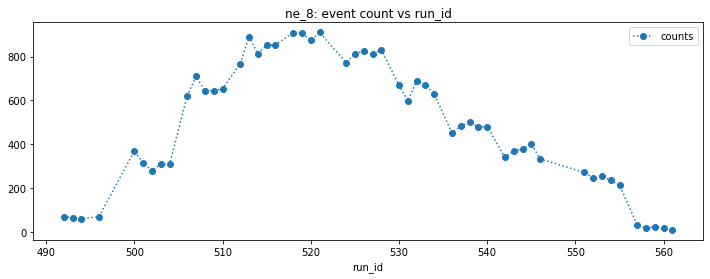

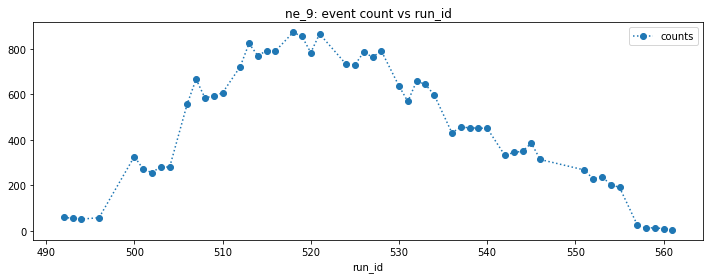

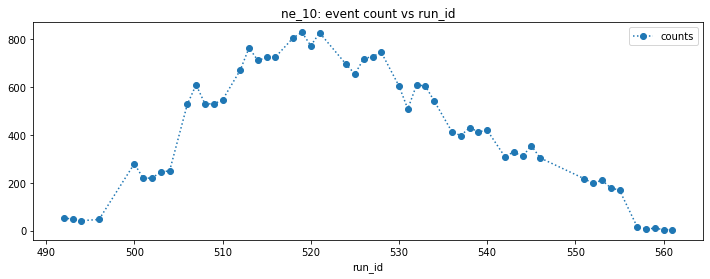

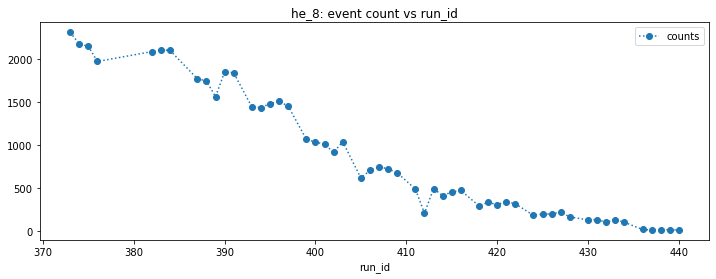

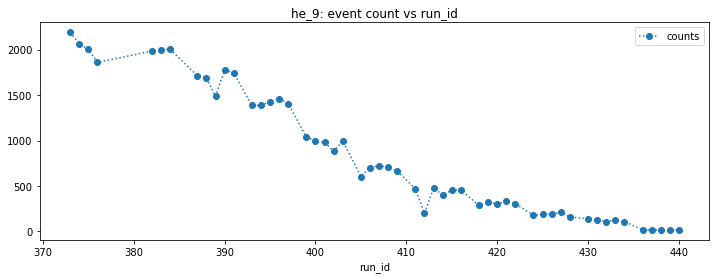

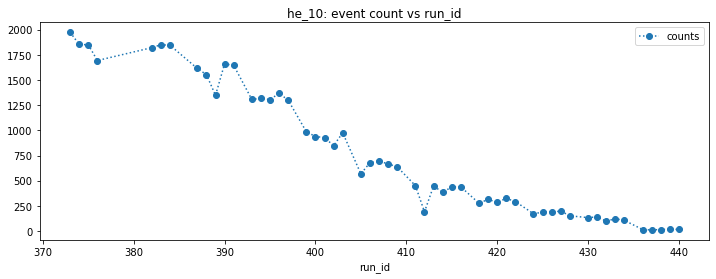

In [9]:
%matplotlib inline
for isotope in snr_study.keys(): 
    for cut in snr_cuts: 
        qc.events_summary(snr_study[isotope][cut].events, title = f"{isotope}_{cut}")
        qc.root_files_summary(snr_study[isotope][cut].root_files, title = f"{isotope}_{cut}")

### QC Test 1: Histogram event attributes.

Notes: Keep an eye out for outliers. 

In [27]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40, np.inf),
            "mTotalNUP": (0, np.inf)
            }

additional_cuts = {
                "EventStartFreq": (200e6, 1200e6),
                "EventNBins": (0, np.inf),
                }
ne_cuts = {**both_cuts, **additional_cuts}
he_cuts = {**both_cuts, **additional_cuts}

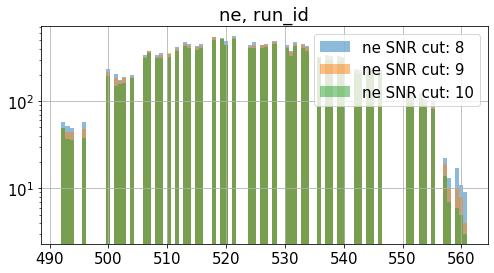

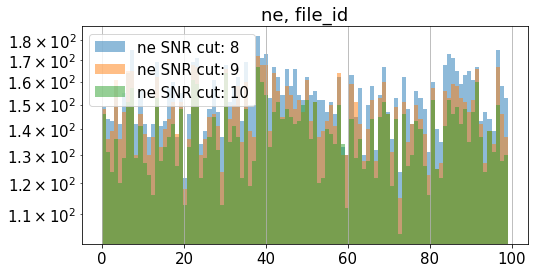

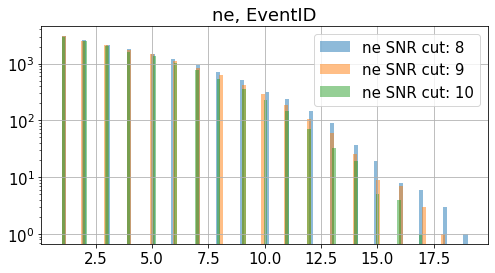

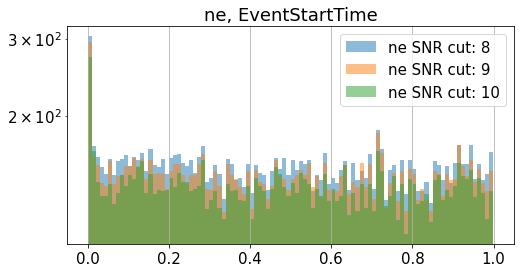

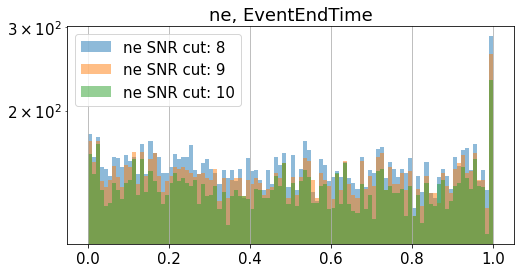

...

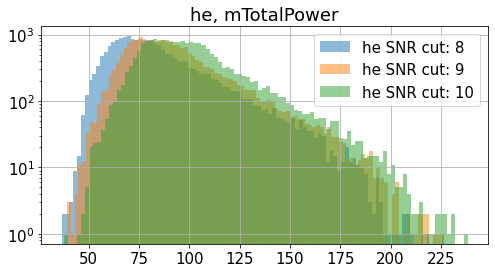

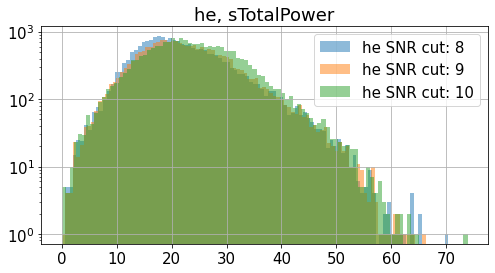

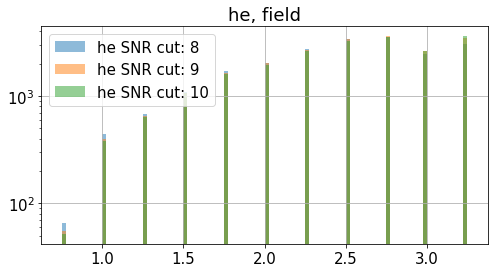

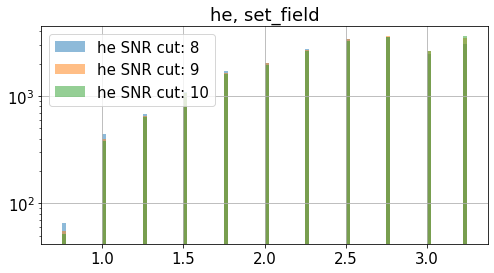

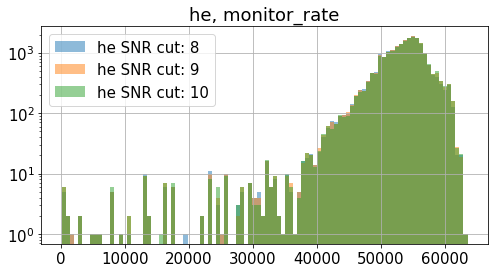

In [28]:
%matplotlib inline
# %matplotlib widget
plt.rcParams.update({'font.size': 15})

for isotope in snr_study.keys(): 
    
    for column in snr_study[isotope][cut].events.columns:

        fig, ax = plt.subplots(figsize=(8,4))
        for cut in snr_cuts: 
            
            events = snr_study[isotope][cut].events

            if isotope == "ne": 
                events_cut = re.cut_df(events, ne_cuts)
            
            if isotope == "he": 
                events_cut = re.cut_df(events, he_cuts)
      
            # Go through each field and make sure things look ok. 
            condition = (events_cut.set_field != 100)
         
            events_cut = events_cut[condition]

            density = False

            events_cut.hist(column = column, bins = 100, density = density,  alpha = .5, ax = ax, label = f"{isotope} SNR cut: {cut}")

        plt.title(f"{isotope}, {column}")
        ax.set_yscale("log")
        plt.legend()

        plt.show()

### QC Test 2: Look at the 10,50,90 quartiles of all feature distributions. 

Notes: Keep an eye out for outliers.

In [14]:
# 10th Percentile
def q10(x):
    return x.quantile(0.1)

# 50th Percentile
def q50(x):
    return x.quantile(0.5)

# 90th Percentile
def q90(x):
    return x.quantile(0.9)

In [15]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40, np.inf),
            "mTotalNUP": (0, np.inf)
            }

additional_cuts = {
                "EventStartFreq": (200e6, 1200e6),
                "EventNBins": (0, np.inf),
                }
ne_cuts = {**both_cuts, **additional_cuts}
he_cuts = {**both_cuts, **additional_cuts}

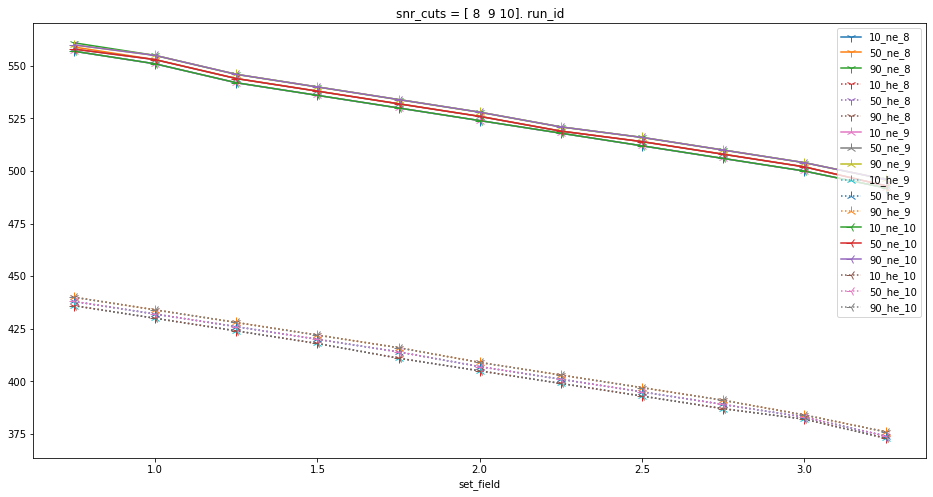

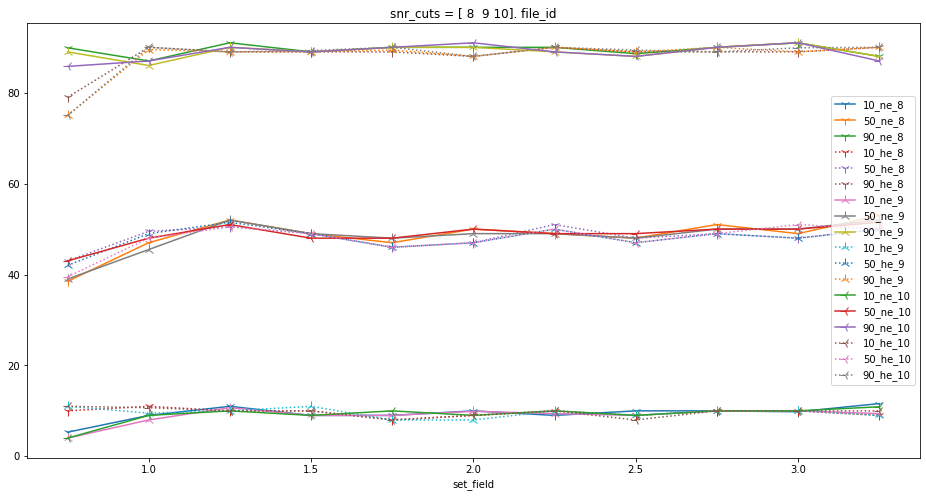

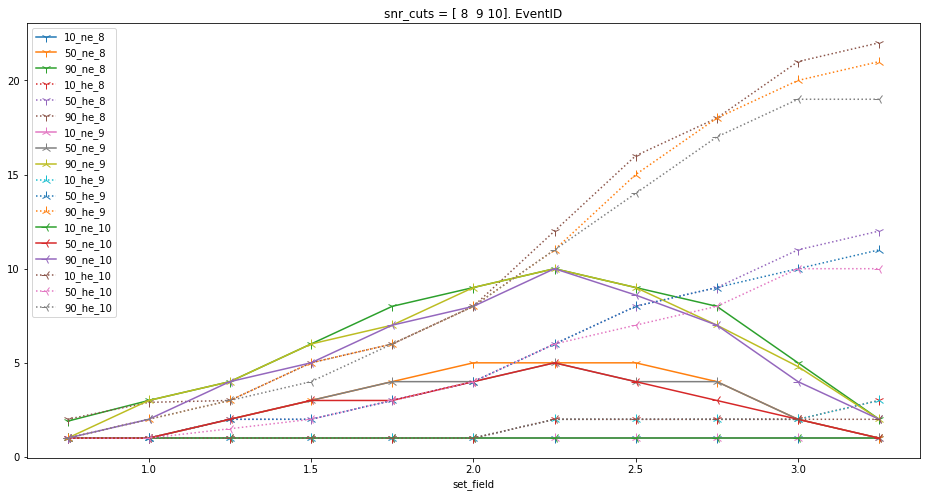

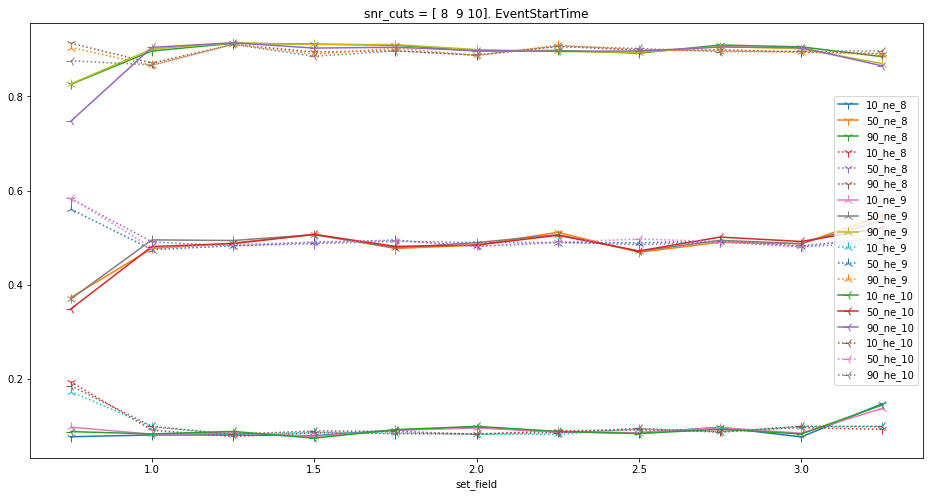

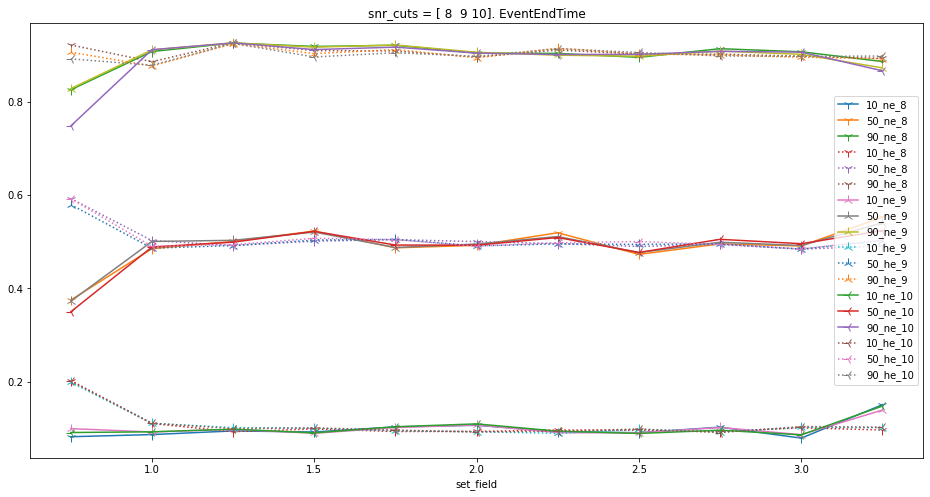

...

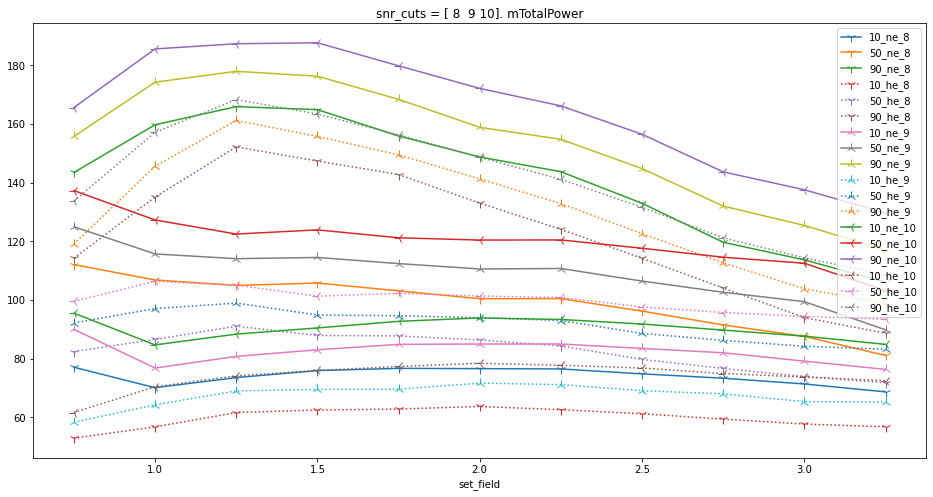

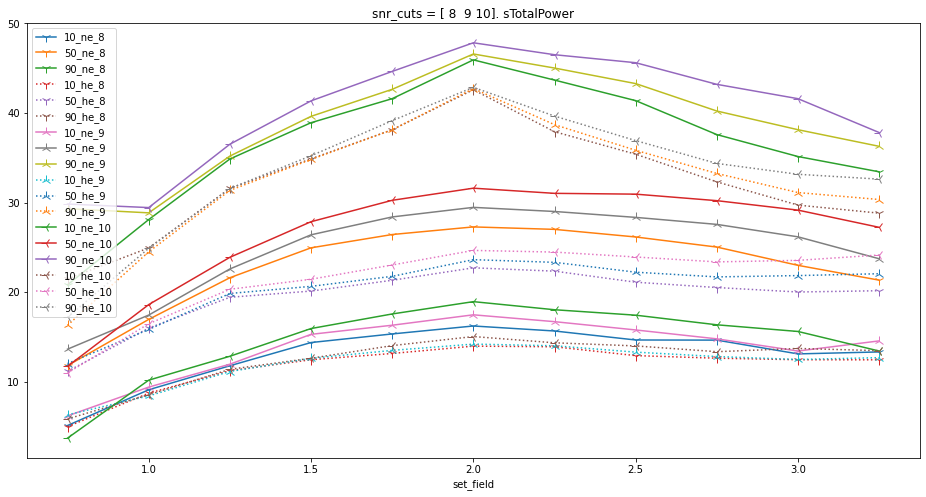

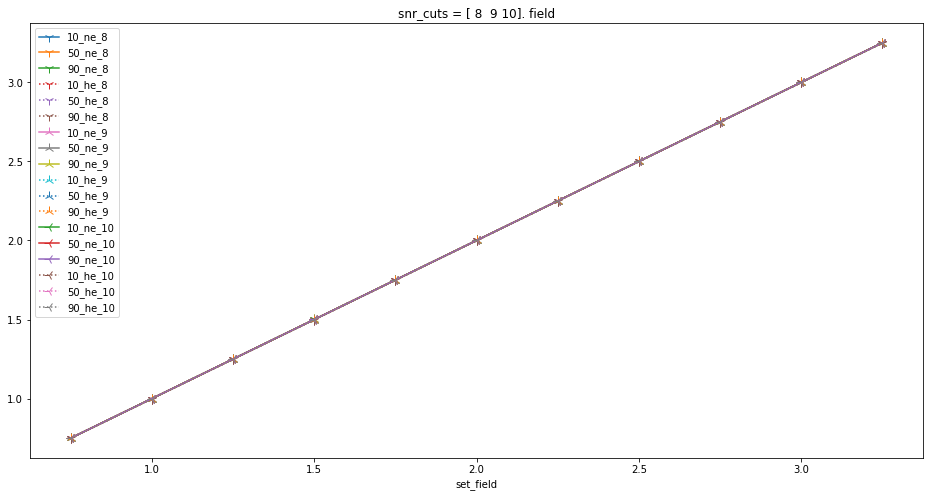

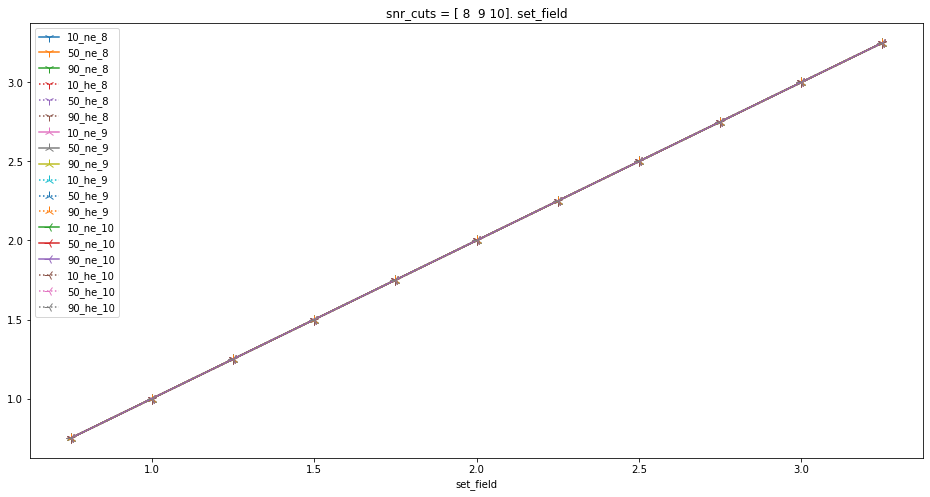

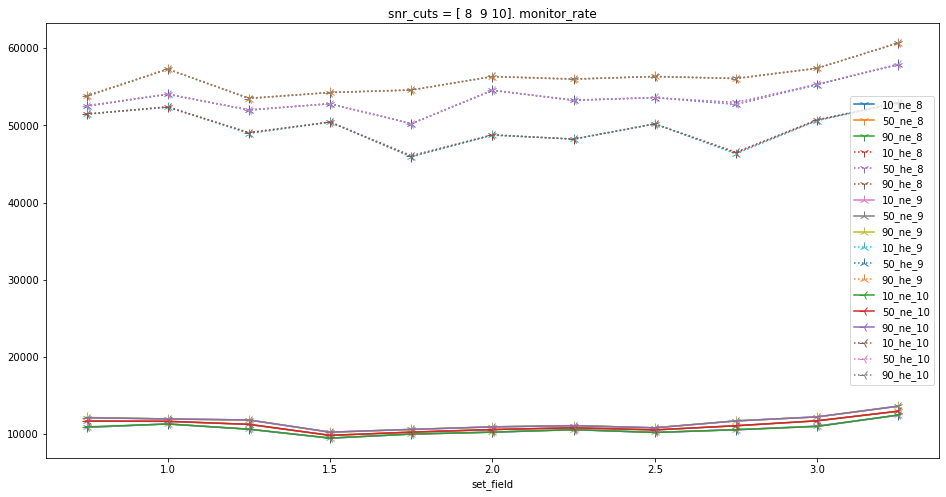

In [16]:
%matplotlib inline

aggs = [q10, q50, q90]
col_names = ["10", "50", "90"]

snr_cuts = np.arange(8,11,1)
for column in snr_study["ne"][8].events.columns: 
    
    fig0, ax0 = plt.subplots(figsize=(16,8))
    for i, cut in enumerate(snr_cuts):
        
        events_ne = snr_study["ne"][cut].events
        events_he = snr_study["he"][cut].events
        # print(events_ne.EventStartFreq.min())
        events_cut_ne = re.cut_df(events_ne, ne_cuts)
        events_cut_he = re.cut_df(events_he, he_cuts)
        # print(events_cut_ne.EventStartFreq.min())
        ne_col_names = [col_name + f"_ne_{cut}" for col_name in col_names]
        he_col_names = [col_name + f"_he_{cut}" for col_name in col_names]
        orig_col_names = ["q" + col_name for col_name in col_names]

        events_cut_ne.groupby("set_field")[column].agg(aggs).rename(columns = dict(zip(orig_col_names, ne_col_names))).plot(ax = ax0, marker =f"{i+1}", ms = 10 )
        events_cut_he.groupby("set_field")[column].agg(aggs).rename(columns = dict(zip(orig_col_names, he_col_names))).plot(ax = ax0, ls = "dotted",marker =f"{i+1}", ms = 10)
    plt.title(f"snr_cuts = {snr_cuts}. {column}")
    plt.legend()
    plt.show()
    

### QC Test 3: Visualize Events to gaurentee things look sensible. 

* Notes: 
    * I don't see anything too weird. Lots coming from below for he... 

In [17]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40, np.inf),
            "mTotalNUP": (0, np.inf)
            }

additional_cuts = {
                "EventStartFreq": (0e6, 1200e6),
                "EventNBins": (0, np.inf),
                }
ne_cuts = {**both_cuts, **additional_cuts}
he_cuts = {**both_cuts, **additional_cuts}




NEON


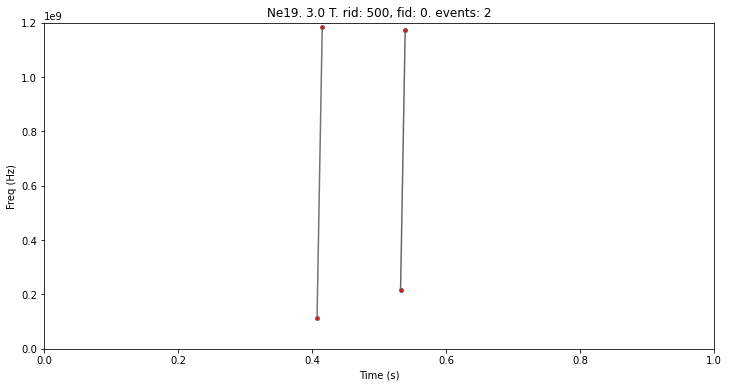

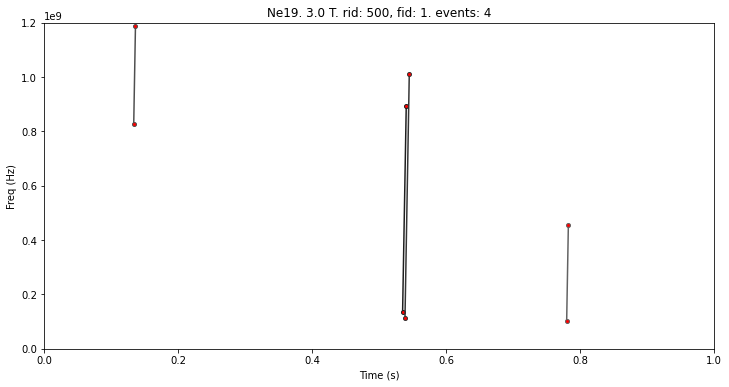

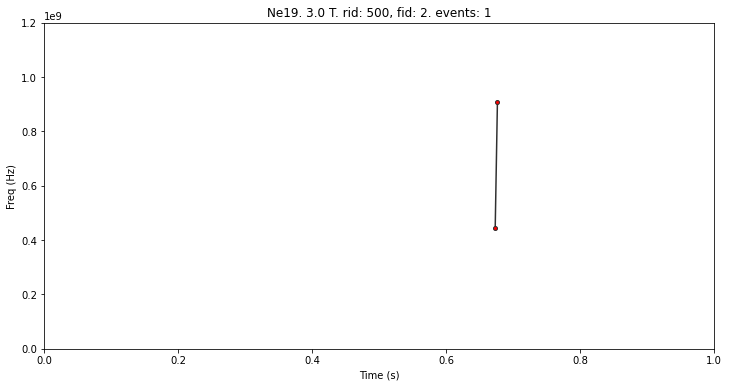

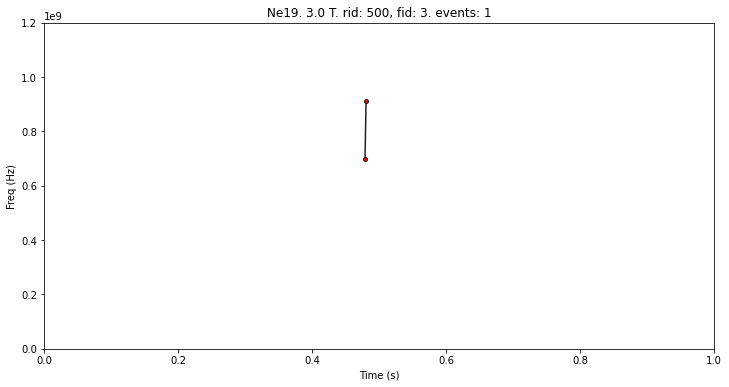

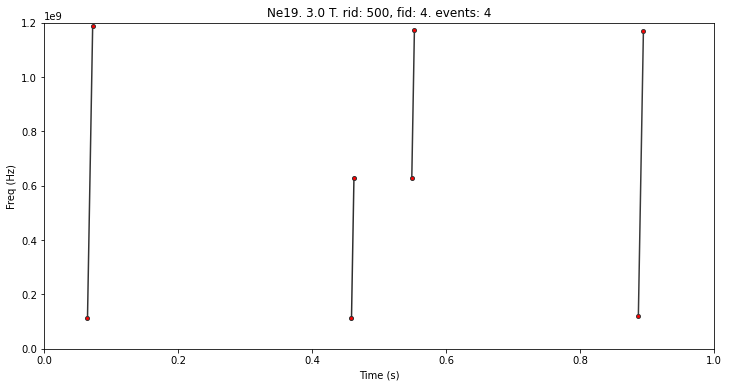

...

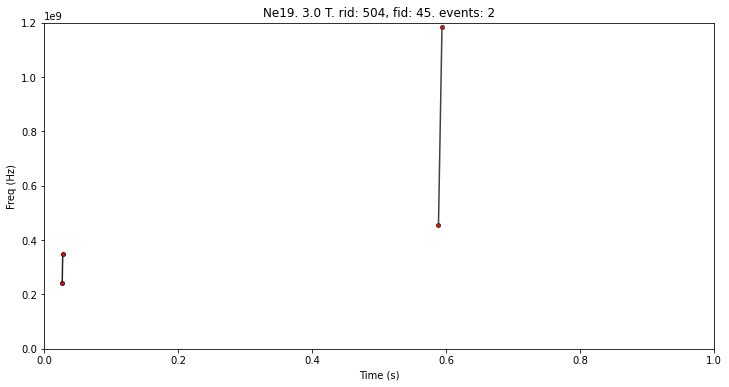

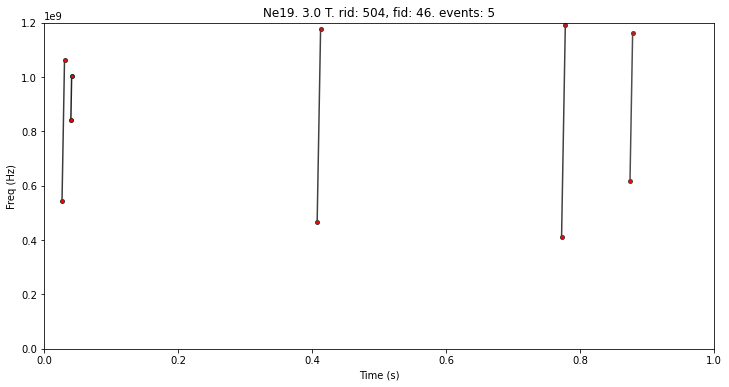

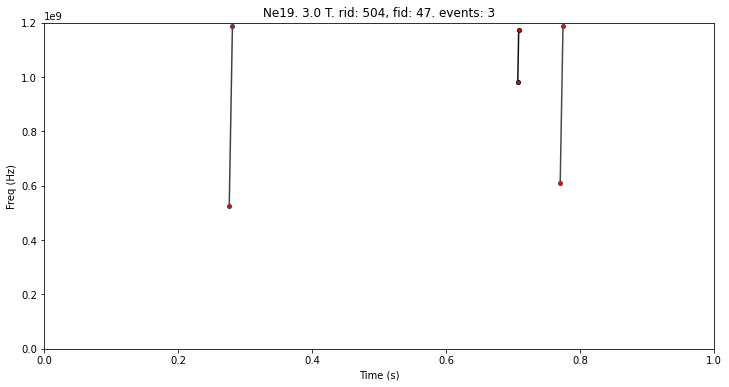

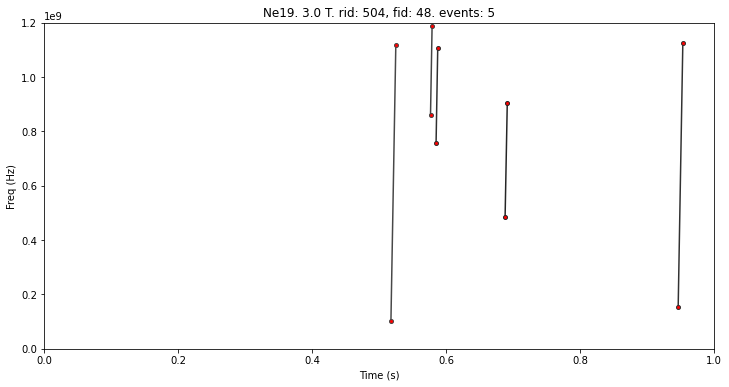

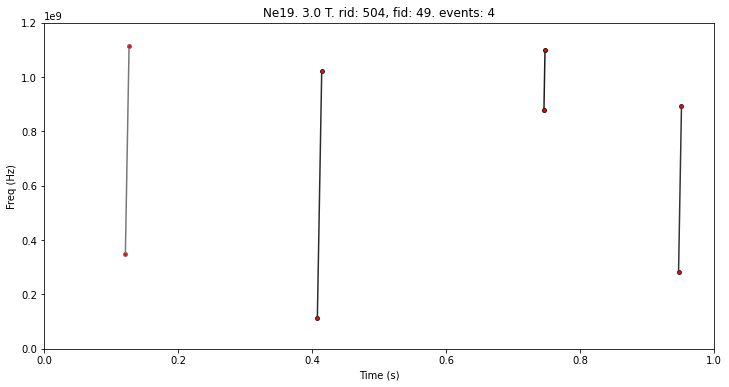




HELIUM


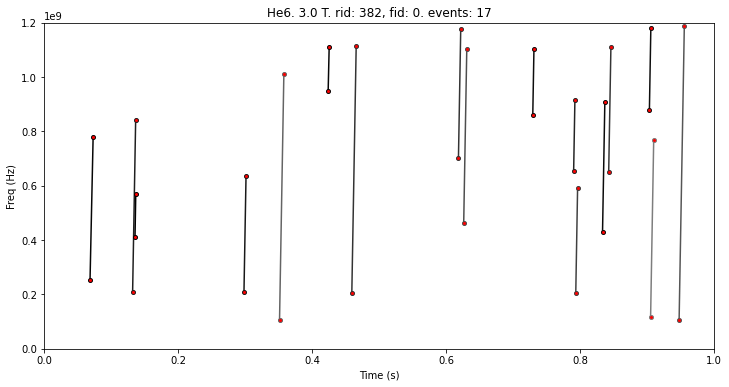

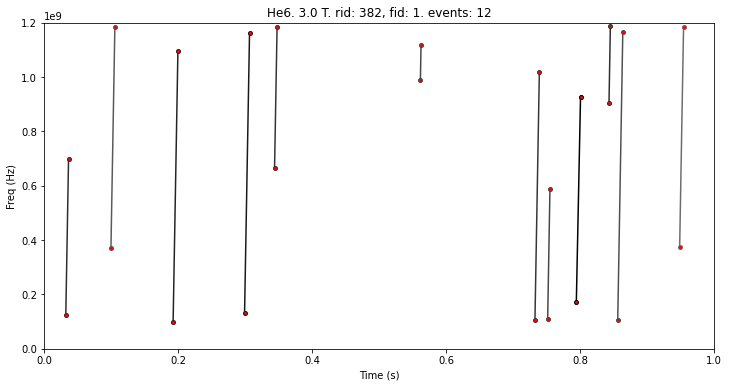

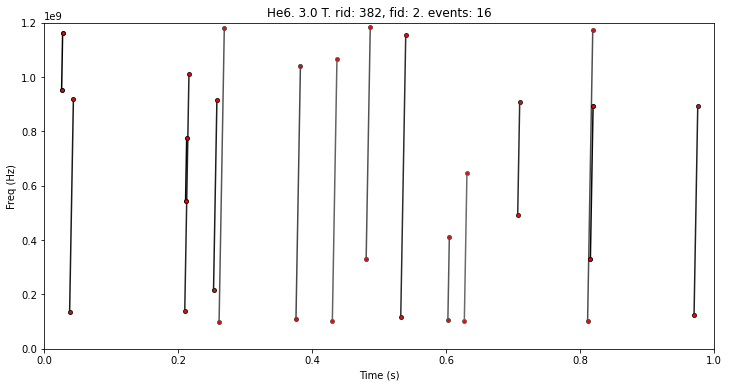

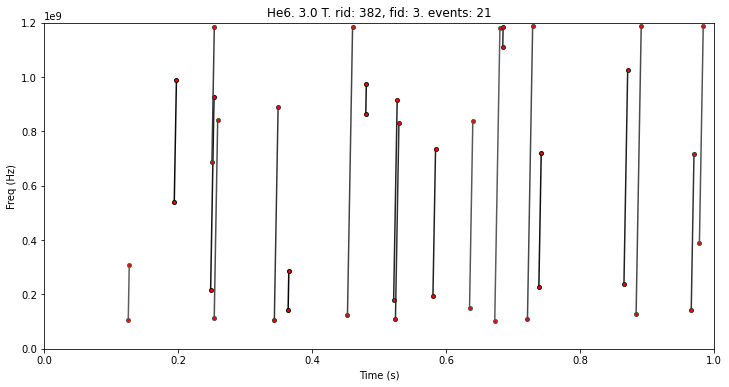

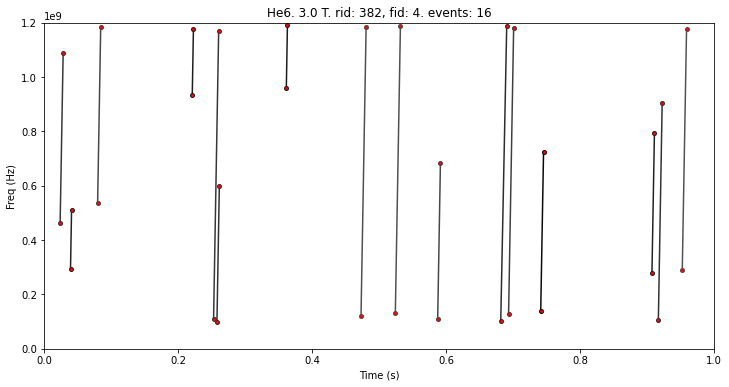

...

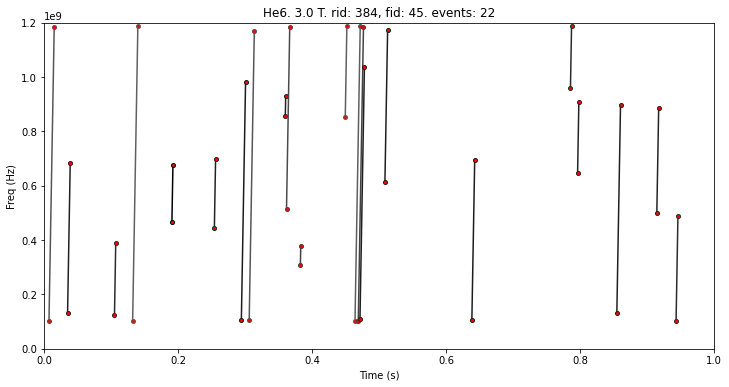

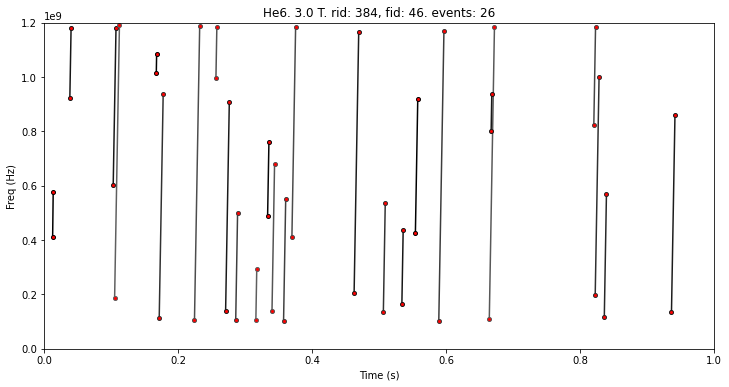

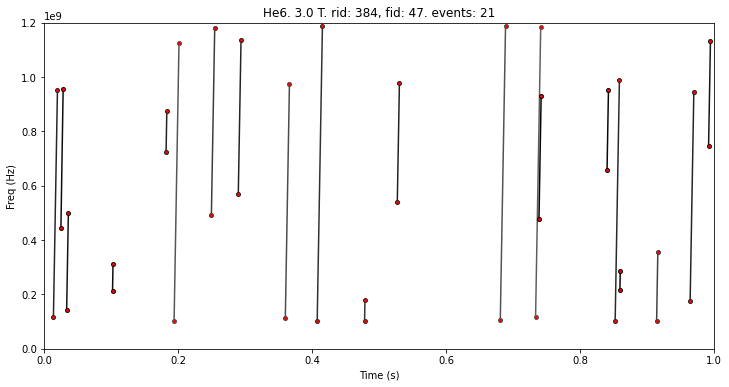

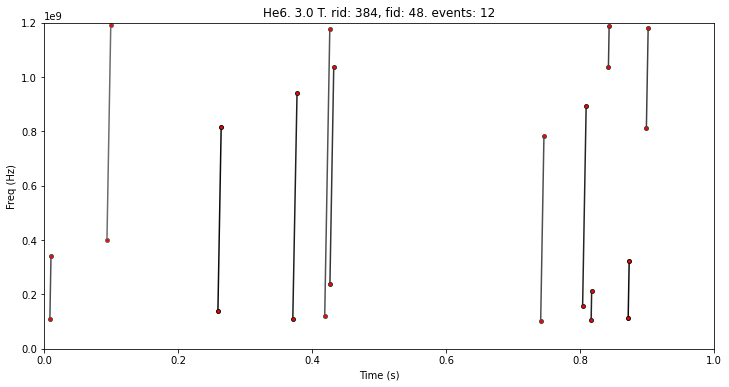

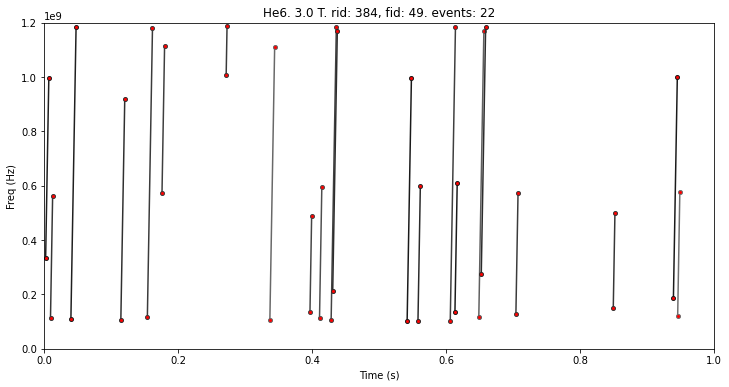

In [85]:
cut = 9
set_fields = [3.0]
fid_max = 50

events_ne = snr_study["ne"][cut].events
events_he = snr_study["he"][cut].events

events_cut_ne = re.cut_df(events_ne, ne_cuts)
events_cut_he = re.cut_df(events_he, he_cuts)

print("\n\n\nNEON")
qc.viz_events(events_cut_ne, file_id_max=fid_max, set_fields = set_fields, title = "Ne19")

print("\n\n\nHELIUM")
qc.viz_events(events_cut_he, file_id_max=fid_max, set_fields = set_fields, title = "He6")


### QC Test 4: Visualize event properties vs field vs start frequency.

* Notes: 
    * I don't see anything too weird. Lots coming from below for he...

In [ ]:
# ------ Set Plot Parameters -----------

params = {
    "axes.titlesize": 12,
    "legend.fontsize": 10,
    "axes.labelsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
}
plt.rcParams.update(params)
# ------ Load events for he and ne ------

# # read in He-6 data
# he_events_path = (
#     "/media/drew/T7 Shield/rocks_analysis/saved_experiments/he6_full_0_aid_1/events.csv"
# )
# he = pd.read_csv(he_events_path, index_col=0)

# # read in Ne-19 data
# ne_events_path = "/media/drew/T7 Shield/rocks_analysis/saved_experiments/ne19_full_0_aid_2/events.csv"
# ne = pd.read_csv(ne_events_path, index_col=0)

# # ------ Make base cuts and drop currupt files -------

# he = he[~he.run_id.isin([377, 380, 381])]
# ne = ne[~ne.run_id.isin([522])]

# # -------- Plotting Grid of Histograms ------------


def hist_grid_by_field(
    ne,
    he,
    feature,
    nrows,
    yscale,
    bins,
    fig_path,
    apply_cut=True,
    cuts={"EventStartFreq": (150e6,1200e6)},
):

    if apply_cut:
        he_c = cut_df(he, cuts)
        ne_c = cut_df(ne, cuts)
        
        
        # # Apply cuts.
        # he_c = he[
        #     (he["EventStartFreq"] > cuts["EventStartFreq"])
        #     & (he["EventMeanSNR"] > cuts["EventMeanSNR"])
        # ]
        # ne_c = ne[
        #     (ne["EventStartFreq"] > cuts["EventStartFreq"])
        #     & (ne["EventMeanSNR"] > cuts["EventMeanSNR"])
        # ]

    else:
        he_c = he
        ne_c = ne

    grouped_ne = ne_c.groupby("set_field")
    grouped_he = he_c.groupby("set_field")
    rowlength = int(np.ceil(grouped_ne.ngroups / 3))
    fig, axs = plt.subplots(
        figsize=(25, 12),
        nrows=3,
        ncols=rowlength,  # fix as above
        gridspec_kw=dict(hspace=0.8),
    )  # Much control of gridspec

    targets = zip(grouped_ne.groups.keys(), axs.flatten())

    for i, (key, ax) in enumerate(targets):

        ne_field = grouped_ne.get_group(key)[feature]
        he_field = grouped_he.get_group(key)[feature]

        # Calculate KS test for similarity of samples.
        ks = stats.kstest(ne_field, he_field)

        ax.hist(ne_field, bins=bins, histtype="step", density=True, label="Ne")
        ax.hist(he_field, bins=bins, histtype="step", density=True, label="He")
        ax.set_title(f"field: {key} T. KS pval = {ks.pvalue:.4f}")
        ax.set_yscale(yscale)
        ax.set_xlabel(feature)
        ax.legend()

    fig.suptitle(f"{feature}. Cuts = {cuts}.", fontsize=25)
    plt.savefig(fig_path, bbox_inches="tight", dpi=200)

    return None


# ----- Loop through all features and make a hist plot with and without cuts ----

# Set parameters of plot.

nrows = 3
bins = 80
yscale = "log"
base_path = "/media/drew/T7 Shield/rocks_analysis/paper_02_figures/ratio_cuts_03202023"

# Cuts to make for each set of plots:


# ne.columns.to_list()
features = [
    "EventStartTime",
    "EventStartFreq",
    "EventEndFreq",
    "EventTimeLength",
    "EventFreqLength",
    "EventTrackCoverage",
    "EventMeanSNR",
    "EventSlope",
    "EventNBins",
    "EventTrackTot",
    "EventFreqIntc",
    "EventTimeIntc",
]



dir_path = Path(base_path) / Path(f"freq_snr__{freq_cut:.0f}_{snr_cut:.0f}")

if not dir_path.exists(): 
    dir_path.mkdir()

for feature in features:

    cuts = {"EventStartFreq": freq_cut*1e6, "EventMeanSNR": snr_cut}

    print(f"Building hist for {feature}. cuts = {cuts}.")

    fig_path = dir_path / Path(f"{feature}_event_hist.png")

    hist_grid_by_field(ne, he, feature, nrows, yscale, bins, fig_path, apply_cut = True, cuts=cuts)


freq = np.arange(100, 600, 50)
snr = np.arange(10, 20, 2)

freq_cuts, snr_cuts = np.meshgrid(freq, snr)
freq_cuts = freq_cuts.flatten()
snr_cuts = snr_cuts.flatten()

# Breaking this into blocks and then running a few times because the process 
# keeps getting killed. 
cuts = list(zip(freq_cuts, snr_cuts))
len_cuts = len(cuts)
cut_chunks = [cuts[x:x+10] for x in range(0, len(cuts), 10)]

print(len(cut_chunks))

i = 4
for freq_cut, snr_cut in cut_chunks[i]:

    dir_path = Path(base_path) / Path(f"freq_snr__{freq_cut:.0f}_{snr_cut:.0f}")

    if not dir_path.exists(): 
        dir_path.mkdir()

    for feature in features:
     
        cuts = {"EventStartFreq": freq_cut*1e6, "EventMeanSNR": snr_cut}

        print(f"Building hist for {feature}. cuts = {cuts}.")

        fig_path = dir_path / Path(f"{feature}_event_hist.png")

        hist_grid_by_field(ne, he, feature, nrows, yscale, bins, fig_path, apply_cut = True, cuts=cuts)


## **Step 3: Make and compare ratio for the 3 SNR cuts.**

* Follow along from the building spectrum ipynb. 

**Notes**: 

* Basing much of this analysis off of this: http://localhost:8889/lab/tree/He6CRES/rocks_analysis_notebooks/building_spectrum_11282022.ipynb but not here. 

In [84]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40,  np.inf),
            "mTotalPower": (50, np.inf), 
            "mTotalNUP": (0,np.inf),
            "mMaxSNR": (0,np.inf)
            }

ne_cuts = both_cuts
he_cuts = both_cuts

### Plot Ratio and normed rate vs freq start cut

* Note: HUGE. This somehow gave sensible results. freq_BW = np.array([17.9e9 + spectrum_cuts["EventStartFreq"][0] ,  19.1e9 -  spectrum_cuts["EventStartFreq"][1]]), even though it's clearly wrong. Shit. 

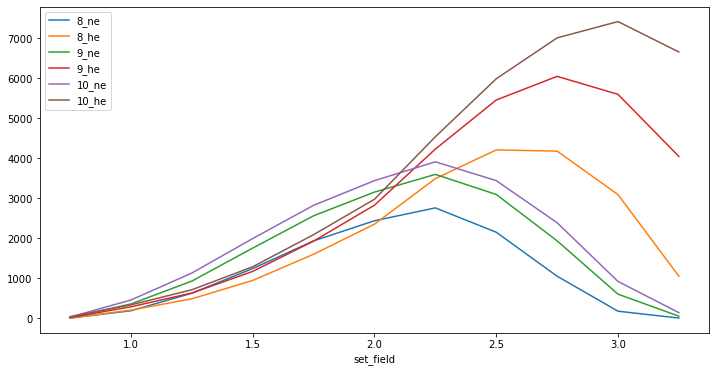

[1.80e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.80e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.80e+10 1.91e+10]
[1.80e+10 1.81e+10]


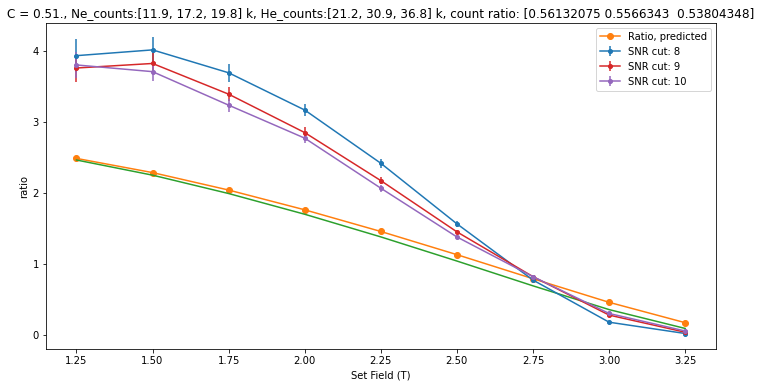

[ 100. 1200.]


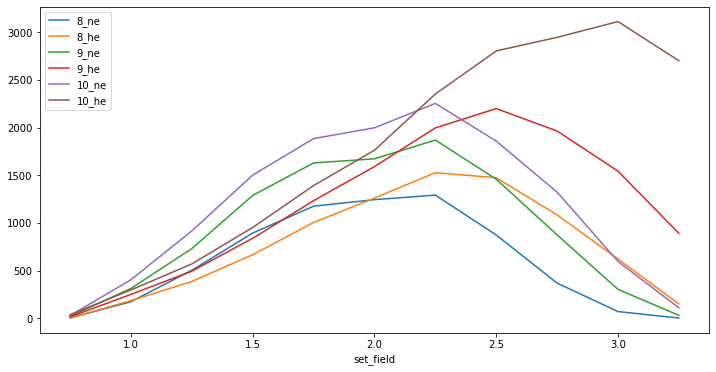

[1.81e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.81e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.81e+10 1.91e+10]
[1.80e+10 1.81e+10]


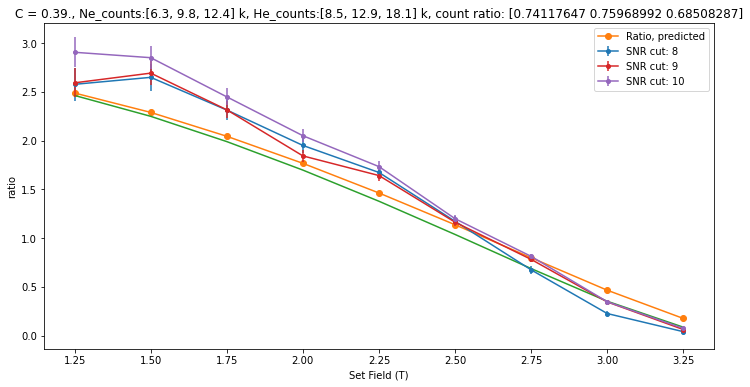

[ 200. 1200.]


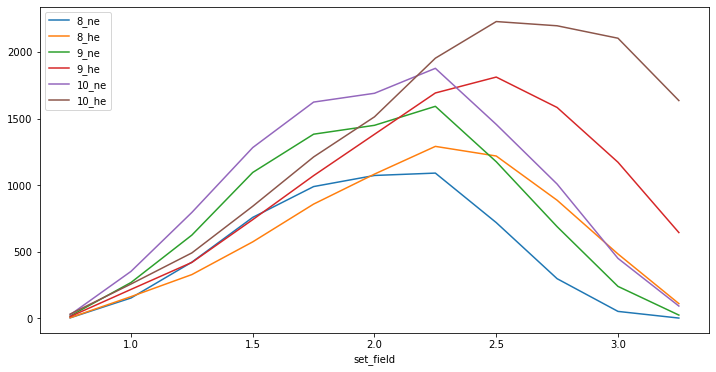

[1.82e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.82e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.82e+10 1.91e+10]
[1.80e+10 1.81e+10]


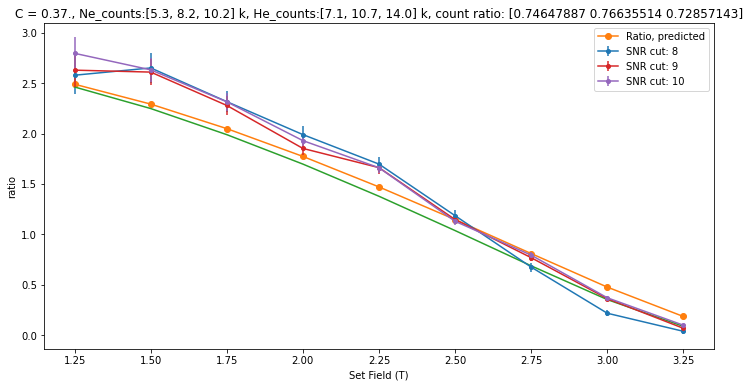

[ 300. 1200.]


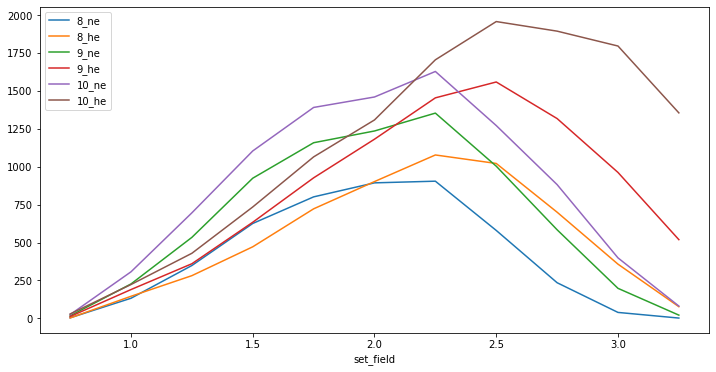

[1.83e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.83e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.83e+10 1.91e+10]
[1.80e+10 1.81e+10]


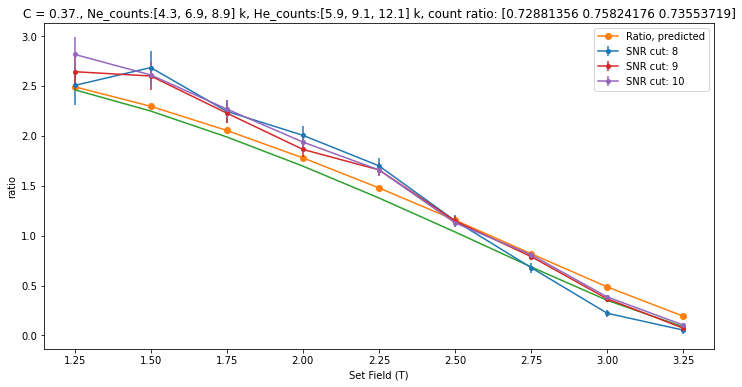

[ 400. 1200.]


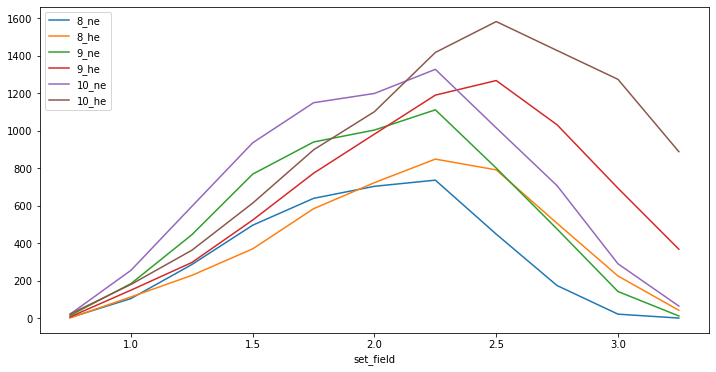

[1.84e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.84e+10 1.91e+10]
[1.80e+10 1.81e+10]
[1.84e+10 1.91e+10]
[1.80e+10 1.81e+10]


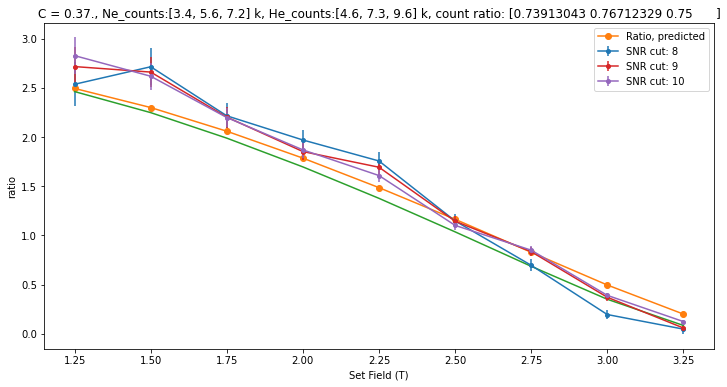

[ 500. 1200.]


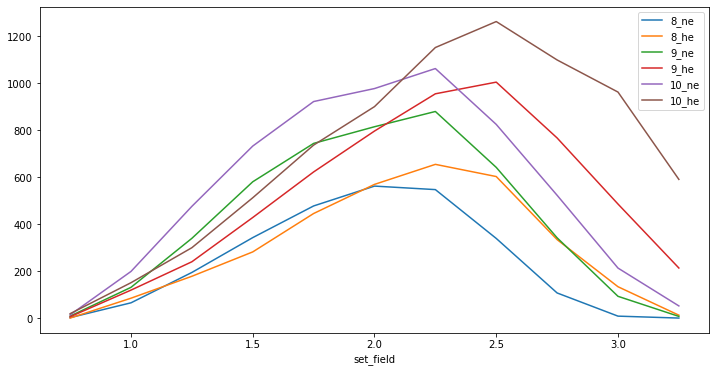

[1.85e+10 1.91e+10]
[1.80e+10 1.81e+10]


ValueError: NaN values detected in your input data or the output of your objective/model function - fitting algorithms cannot handle this! Please read https://lmfit.github.io/lmfit-py/faq.html#i-get-errors-from-nan-in-my-fit-what-can-i-do for more information.

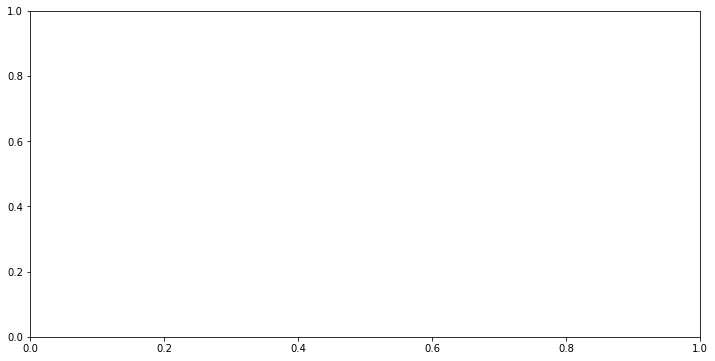

In [83]:
%matplotlib inline

set_fields = np.arange(1.25,3.5,.25)

# for (freq1, freq2) in zip(np.arange(100,1100, 100),np.arange(300,1300, 100)): 
for freq1 in np.arange(100,1100, 100):     
    spectrum_cuts = {
                "EventStartFreq": ((freq1)*1e6, (1200)*1e6)
                }

    ne_cuts = {**both_cuts, **spectrum_cuts}
    he_cuts = {**both_cuts, **spectrum_cuts}

    ne_spectra = []
    he_spectra = []       
    
    for cut in snr_cuts:

        ne = snr_study["ne"][cut]
        ne_spectra.append(re.build_spectrum(ne.events.copy(), ne.root_files.copy(), ne_cuts))

        he = snr_study["he"][cut]
        he_spectra.append(re.build_spectrum(he.events.copy(), he.root_files.copy(), he_cuts))

    snr_study_spectra = { "ne": dict(zip(snr_cuts,ne_spectra)),
                          "he": dict(zip(snr_cuts,he_spectra))}
    fig, ax = plt.subplots(figsize=(12,6))
    for cut in snr_cuts:
        for isotope in snr_study_spectra.keys():

            snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
    plt.show()
    # Make the experimental ratio with new normalization scheme. 
    
    fig0, ax0 = plt.subplots(figsize=(12,6))
    
    ne_counts = []
    he_counts = []
    for cut in snr_cuts: 
        
        ratio_exp = re.build_ratio_altnorm(snr_study_spectra["ne"][cut], snr_study_spectra["he"][cut])

        # Make the predicted ratio.
        freq_BW = np.array([17.9e9 + spectrum_cuts["EventStartFreq"][0] ,  17.9e9 +  spectrum_cuts["EventStartFreq"][1]])
        print(freq_BW)
        freq_BW_wrong = np.array([18.0e9  ,   18.1e9])
        print(freq_BW_wrong)
        freq_BWs = np.tile(freq_BW, (len(set_fields), 1))
        
        ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = 0, plot = False)
        
        # Exploring how different the wrong one is. 
        freq_BWs_wrong = np.tile(freq_BW_wrong, (len(set_fields), 1))
        
        ratio_pred_wrong = rp.AUC_expectation(set_fields, freq_BWs_wrong, b = 0, plot = False)
        
        
        # Only take the fields you want: 
        ratio_pred = ratio_pred[ratio_pred.index.isin(set_fields)]
        ratio_pred_wrong= ratio_pred_wrong[ratio_pred_wrong.index.isin(set_fields)]
        ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]

        # Fit to the free normalization parameter. 
        def objfunc_chisq(C, ratio_pred, ratio_exp ): 

            # I think the lmfit does the least squares on these values for you but double check. 
            chisq_gauss = (ratio_pred["Ratio"] - C*ratio_exp["Ratio"])/ (C*ratio_exp["sRatio"])
            return chisq_gauss

        my_pars = Parameters()
        my_pars.add('C', value=1, min=0, max = 10, vary =True)

        result = minimize(objfunc_chisq, my_pars, args = (ratio_pred, ratio_exp))

        C = result.params["C"].value
        ratio_exp["Ratio"] = C*ratio_exp["Ratio"]
        ratio_exp["sRatio"] = C*ratio_exp["sRatio"]
        
        pm.plot_experimental_ratio(ratio_exp, ax0, label= f"SNR cut: {cut}")
        
        if cut == 8: 
            pm.plot_predicted_ratio(ratio_pred, ax0)
            plt.plot(ratio_pred_wrong.index, ratio_pred_wrong.Ratio)
            
        ne_counts.append(snr_study_spectra["ne"][cut].event_count.sum().round(-2)/1000)
        he_counts.append(snr_study_spectra["he"][cut].event_count.sum().round(-2)/1000)
        count_ratio = np.array(ne_counts)/np.array(he_counts)
    
    # ax0.set_yscale("log")
    ax0.set_ylabel('ratio')
    ax0.set_xlabel('Set Field (T)')
    ax0.set_title(f"C = {C:.2f}., Ne_counts:{ne_counts} k, He_counts:{he_counts} k, count ratio: {count_ratio}")
    ax0.legend()
    plt.show()
    print(np.array(spectrum_cuts["EventStartFreq"])/1e6)

## **Paper01 resubmission plot.**

**Notes**

* Sharing with Heather. 
* Make it with log and linear. 
* Write the df to disk then have the function take the df path as an argument. 

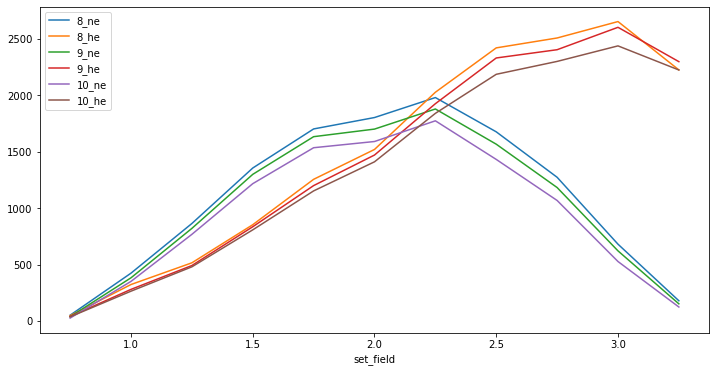

[1.83e+10 1.91e+10]
[1.83e+10 1.91e+10]
[1.83e+10 1.91e+10]


In [15]:
%matplotlib inline

set_fields = np.arange(.75,3.5,.25)

     
spectrum_cuts = {
            "EventStartFreq": ((400)*1e6, (1200)*1e6)
            }

ne_cuts = {**both_cuts, **spectrum_cuts}
he_cuts = {**both_cuts, **spectrum_cuts}

ne_spectra = []
he_spectra = []       

for cut in snr_cuts:

    ne = snr_study["ne"][cut]
    ne_spectra.append(re.build_spectrum(ne.events.copy(), ne.root_files.copy(), ne_cuts))

    he = snr_study["he"][cut]
    he_spectra.append(re.build_spectrum(he.events.copy(), he.root_files.copy(), he_cuts))

snr_study_spectra = { "ne": dict(zip(snr_cuts,ne_spectra)),
                      "he": dict(zip(snr_cuts,he_spectra))}
fig, ax = plt.subplots(figsize=(12,6))
for cut in snr_cuts:
    for isotope in snr_study_spectra.keys():

        snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
plt.show()
# Make the experimental ratio with new normalization scheme. 

ne_counts = []
he_counts = []
for cut in snr_cuts: 

    ratio_exp = re.build_ratio_altnorm(snr_study_spectra["ne"][cut], snr_study_spectra["he"][cut])

    # Make the predicted ratio.
    freq_BW = np.array([17.9e9 + spectrum_cuts["EventStartFreq"][0] ,  17.9e9 +  spectrum_cuts["EventStartFreq"][1]])
    freq_BWs = np.tile(freq_BW, (len(set_fields), 1))
    print(freq_BW)
    ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = 0, plot = False)

    # Only take the fields you want: 
    ratio_pred = ratio_pred[ratio_pred.index.isin(set_fields)]
    ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]

    # Fit to the free normalization parameter. 
    def objfunc_chisq(C, ratio_pred, ratio_exp ): 

        # I think the lmfit does the least squares on these values for you but double check. 
        chisq_gauss = (ratio_pred["Ratio"] - C*ratio_exp["Ratio"])/ (C*ratio_exp["sRatio"])
        return chisq_gauss

    my_pars = Parameters()
    my_pars.add('C', value=1, min=0, max = 10, vary =True)

    result = minimize(objfunc_chisq, my_pars, args = (ratio_pred[2:], ratio_exp[2:]))

    C = result.params["C"].value
    ratio_exp["Ratio"] = C*ratio_exp["Ratio"]
    ratio_exp["sRatio"] = C*ratio_exp["sRatio"]
    
    # display(ratio_exp)
    base = "saved_ratio_dfs/"
    path = f"exp_ratio_snr_{cut}.csv"
    ratio_exp.to_csv(base + path)

    # pm.plot_experimental_ratio(ratio_exp, ax0, label= f"SNR cut: {cut}")
        
    if cut == 8: 
        path = f"pred_ratio.csv"
        ratio_pred.to_csv(base + path)
        
        ratio_pred_alt = rp.AUC_expectation(set_fields, freq_BWs, b = 1, plot = False)
        path = f"pred_ratio_b=1.csv"
        ratio_pred_alt.to_csv(base + path)
        
        ratio_pred_alt = rp.AUC_expectation(set_fields, freq_BWs, b = -1, plot = False)
        path = f"pred_ratio_b=-1.csv"
        ratio_pred_alt.to_csv(base + path)

    
    

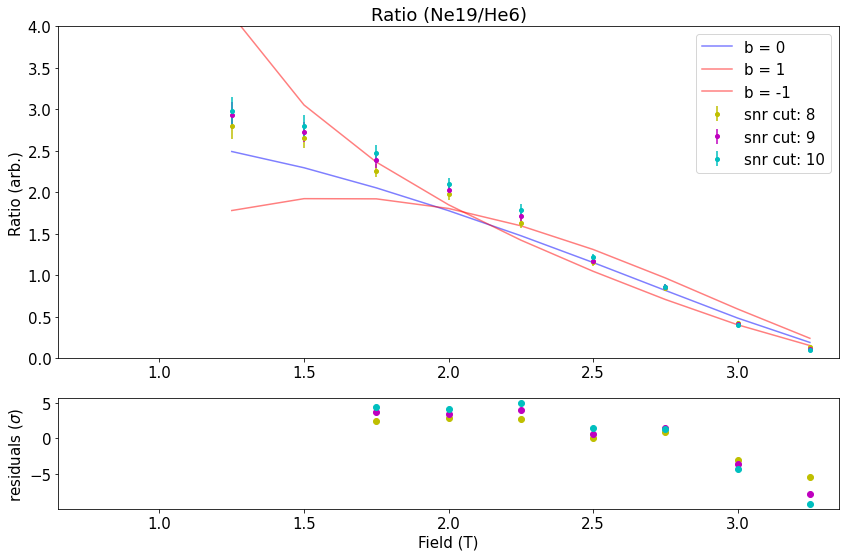

In [16]:
def build_ratio_plot(ax0, ax1, dir_path = "saved_ratio_dfs", yscale = "linear"): 
    
    # Plot the predicted ratio. 
    pred_ratio = pd.read_csv(dir_path + "/pred_ratio.csv", index_col = 0)
    pred_ratio_1 = pd.read_csv(dir_path + "/pred_ratio_b=1.csv", index_col = 0)
    pred_ratio_minus1 = pd.read_csv(dir_path + "/pred_ratio_b=-1.csv", index_col = 0)
    
    ax0.plot(pred_ratio.index, pred_ratio.Ratio, label= "b = 0", color = "b", alpha = .5 )
    ax0.plot(pred_ratio_1.index, pred_ratio_1.Ratio, label= "b = 1", color = "r", alpha = .5 )
    ax0.plot(pred_ratio_minus1.index, pred_ratio_minus1.Ratio, label= "b = -1", color = "r", alpha = .5 )
    
    exp_ratios = [pd.read_csv(dir_path + f"/exp_ratio_snr_{cut}.csv", index_col = 0) for cut in range(8,11,1) ]
    colors = ["y", "m", "c"] 
    for i, (exp_ratio, cut) in enumerate(zip(exp_ratios,range(8,11,1))): 

        # Plot the experimental ratio. 
        ax0.errorbar(
        exp_ratio.index,
        exp_ratio.Ratio,
        yerr=exp_ratio.sRatio,
        label=f"snr cut: {cut}",
        marker="o",
        ls = "None",
        ms=4, 
        alpha = 1, 
        color = colors[i])
        
        # Plot the residuals starting at 1.25 T (index = 2)
        start = 2
        ax1.plot(pred_ratio.index[start:], (exp_ratio.Ratio.iloc[start:] - pred_ratio.Ratio.iloc[start:])/exp_ratio.sRatio.iloc[start:] , 
                 label= f"snr cut: {cut}", 
                 marker="o", 
                 ls = "None",
                 ms=6, 
                 color = colors[i])
    
    
    ax0.set_yscale(yscale)
    ax0.set_ylabel('Ratio (arb.)')
    ax0.set_title(f"Ratio (Ne19/He6)")
    ax0.legend()
    
    ax1.set_xlabel('Field (T)')
    ax1.set_ylabel(r'residuals ($\sigma$)')
    
    ax0.set_xlim(.65,3.35)
    ax1.set_xlim(.65,3.35)
    ax0.set_ylim(0,4)
    
    
    return None


plt.rcParams.update({'font.size': 15})
f, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(12,8))
build_ratio_plot(ax0,ax1, yscale = "linear")

plt.tight_layout()
plt.show()

## **Step 4: Energy domain and finer frequency bins.**

* ??

**Notes**: 

* Basing a lot of this work on the simulation work I did here: http://localhost:8888/lab/tree/He6CRES/rocks_analysis_notebooks/MC_thesis_studies.ipynb

In [22]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40,  np.inf),
            "mTotalNUP": (0, np.inf),
            "mTotalPower":(0, np.inf)
            }

ne_cuts = both_cuts
he_cuts = both_cuts

### Plot Ratio and normed rate vs freq start cut

In [23]:
b=0
isotopes = {
"Ne19": {
    "W0": 5.339539,
    "Z": 10,
    "A": 19,
    "beta_type": "Mixed",
    "decay_type":"+" ,
    "mixing_ratio": 2.22,
    "R": 2.9,
    "bAc": 0,
    "dAc": 0,
    "Lambda": 0,
    "b": -.7204*b
},
"He6": {
    "W0": 7.859525,
    "Z": 2,
    "A": 6,
    "beta_type": "Gamow-Teller",
    "decay_type":"-" ,
    "mixing_ratio": None,
    "R": 1.6,
    "bAc": 0,
    "dAc": 0,
    "Lambda": 0,
    "b": b
}}
# Feed the info dict to the BetaSpectrum class. 
bspec = bs.BetaSpectrum(isotopes["Ne19"])

Ws = np.linspace(1.001, isotopes["Ne19"]["W0"]-.001, 300)
pdf = bspec.dNdE(Ws)

4


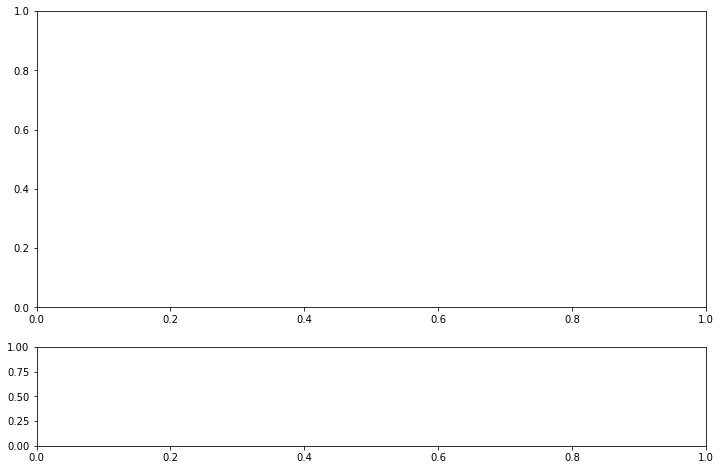

6
[100000000.0, 300000000.0]
[1.80e+10 1.82e+10]
[[1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]]
[[Variables]]
    C:  0.44550429 +/- 0.05868145 (13.17%) (init = 1)
    b: -1.31771419 +/- 0.34573126 (26.24%) (init = 0)
[1.80e+10 1.82e+10]
[[1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]]
[[Variables]]
    C:  0.46058579 +/- 0.06263490 (13.60%) (init = 1)
    b: -1.33990830 +/- 0.34131142 (25.47%) (init = 0)
[1.80e+10 1.82e+10]
[[1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]
 [1.80e+10 1.82e+10]]
[[Variables]]
    C:  0.46427044 +/- 0.06069678 (13.07%) (init = 1)
    b: -1.33741483 +/- 0.3325

ValueError: NaN values detected in your input data or the output of your objective/model function - fitting algorithms cannot handle this! Please read https://lmfit.github.io/lmfit-py/faq.html#i-get-errors-from-nan-in-my-fit-what-can-i-do for more information.

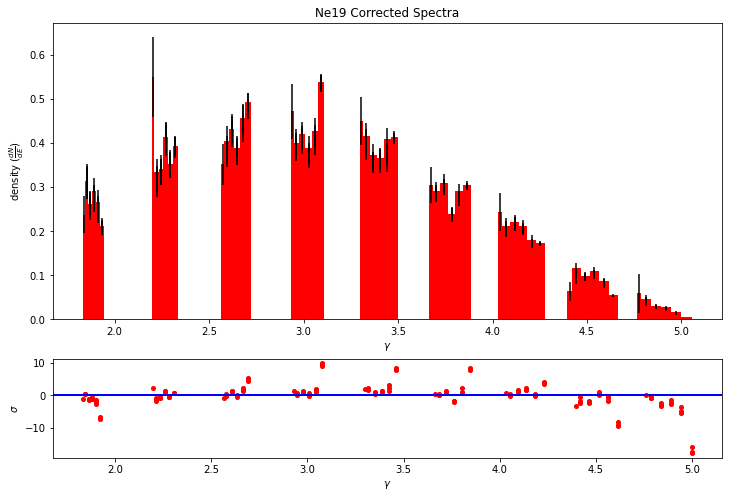

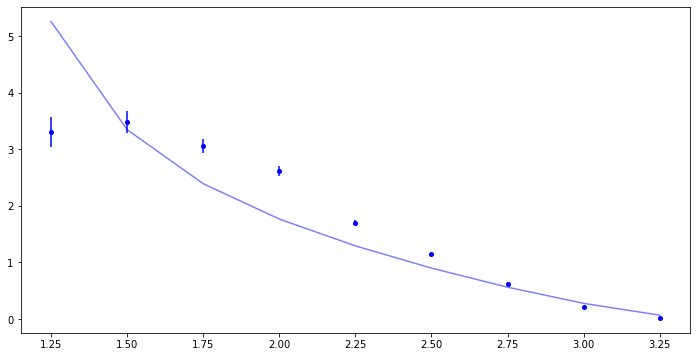

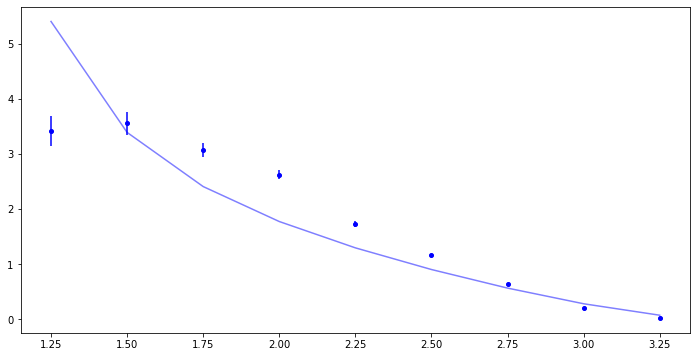

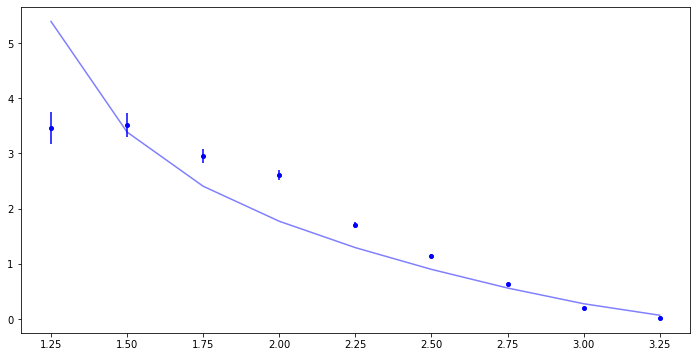

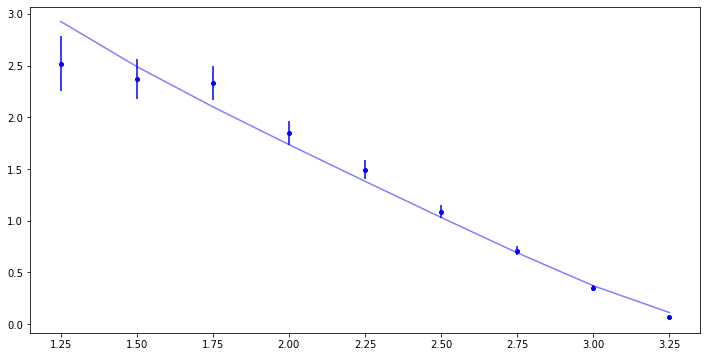

...

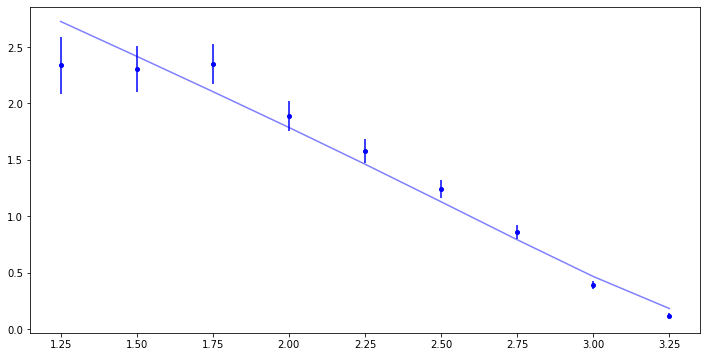

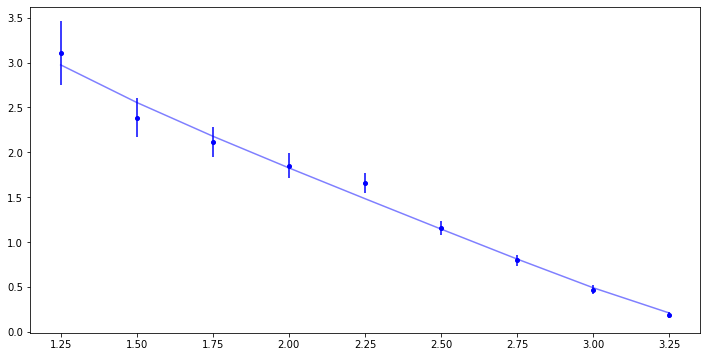

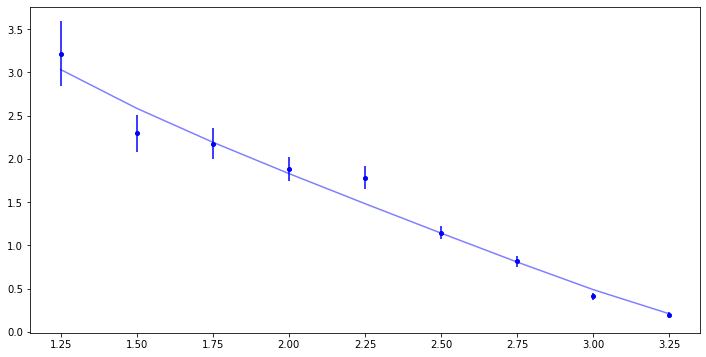

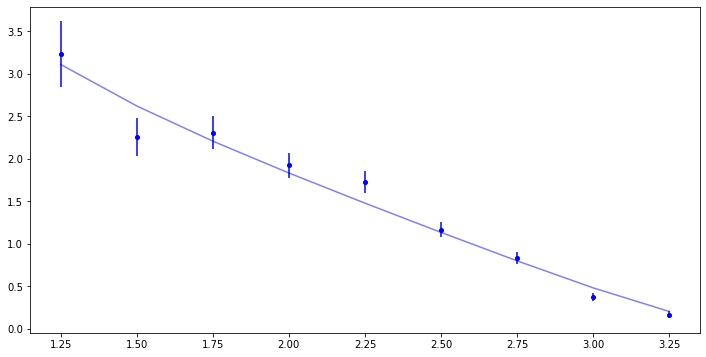

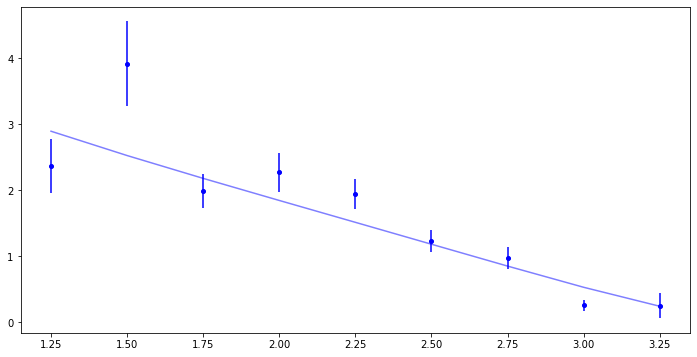

In [33]:
%matplotlib inline

# Plot results.
f, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(12,8))

set_fields = np.arange(1.25,3.5,.25)
snr_cuts = [8,9,10]
mixer_freq = 17.9e9

b_fits = []
b_errs = []

# for (freq1, freq2) in zip(np.arange(100,1100, 100),np.arange(300,1300, 100)):

freq_BW_full = np.array([18.0e9 ,  19.1e9])
freq_BW_tot = freq_BW_full[1] - freq_BW_full[0]
freq_chunk = 200e6
n_chunks = int(np.ceil((freq_BW_tot / freq_chunk)))
print(n_chunks)

b_fits = []
b_errs = []

for i,chunk in enumerate(range(n_chunks)):
    
    freq_BW = np.clip(np.array([freq_BW_full[0]+ freq_chunk*chunk, freq_BW_full[0]+ freq_chunk*(chunk+1)]), 
                      0,freq_BW_full.max())
        
    spectrum_cuts = {
                "EventStartFreq": (freq_BW[0]- mixer_freq, freq_BW[1]-mixer_freq)
                }
    print([spectrum_cuts["EventStartFreq"][0] ,  spectrum_cuts["EventStartFreq"][1]])
    ne_cuts = {**both_cuts, **spectrum_cuts}
    he_cuts = {**both_cuts, **spectrum_cuts}

    ne_spectra = []
    he_spectra = []       
    
    for cut in snr_cuts:

        ne = snr_study["ne"][cut]
        ne_spectra.append(re.build_spectrum(ne.events.copy(), ne.root_files.copy(), ne_cuts))

        he = snr_study["he"][cut]
        he_spectra.append(re.build_spectrum(he.events.copy(), he.root_files.copy(), he_cuts))

    snr_study_spectra = { "ne": dict(zip(snr_cuts,ne_spectra)),
                          "he": dict(zip(snr_cuts,he_spectra))}

#     for cut in snr_cuts:
#         for isotope in snr_study_spectra.keys():

#             snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
#     plt.show()
    # Make the experimental ratio with new normalization scheme. 
    
    
    ne_counts = []
    he_counts = []
    for cut in snr_cuts: 
        
        ratio_exp = re.build_ratio_altnorm(snr_study_spectra["ne"][cut], snr_study_spectra["he"][cut])

        # Make the predicted ratio.
        freq_BW = np.array([mixer_freq+ spectrum_cuts["EventStartFreq"][0] ,  mixer_freq + spectrum_cuts["EventStartFreq"][1]])
        print(freq_BW)
        freq_BWs = np.tile(freq_BW, (len(set_fields), 1))
        print(freq_BWs)

        ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]


            # Conduct fit. 
        my_pars = Parameters()
        my_pars.add('C', value=1, min=-100, max = 100, vary =True)
        my_pars.add('b', value=0, min=-10, max = 10, vary =True)

        result = minimize(we.objfunc_chisq, my_pars, args = (freq_BWs, set_fields, ratio_exp))

        # Fit report.
        print(fit_report(result.params))

        C = result.params["C"].value
        b = result.params["b"].value

        # Get the SM prediction.
        ratio_pred = we.AUC_expectation_we(set_fields, freq_BWs, b = b, plot = False, wall_effect = False)

        ratio_corr = ratio_exp.copy()
        ratio_corr["Ne19_corr"] = C*ratio_pred["He6"]*ratio_exp["Ratio"]
        ratio_corr["sNe19_corr"] = C*ratio_pred["He6"]*ratio_exp["sRatio"]

        gamma_acceptances, gamma_widths, gamma_heights, gamma_height_errs, SM_heights = ed.freq_to_energy_domain(
        set_fields, freq_BWs, ratio_corr, ratio_pred)

        label_bool = i==0
        ed.energy_domain_plot(ax0,ax1, gamma_acceptances, gamma_widths, 
                              gamma_heights, gamma_height_errs, SM_heights, 
                              ratio_corr, ratio_pred, label = label_bool) 

        # Now add to the list of b_normed

        b_fits.append(result.params["b"].value)
        b_errs.append(result.params["b"].stderr)
        
        fig, ax = plt.subplots(figsize=(12,6))
            # Plot the experimental ratio. 
        ax.errorbar(
        ratio_corr.index,
        C*ratio_corr.Ratio,
        yerr=C*ratio_corr.sRatio,
        label=f"snr cut: {cut}",
        marker="o",
        ls = "None",
        ms=4, 
        alpha = 1, 
        color = "b")
        
        ax.plot(ratio_pred.index, ratio_pred.Ratio, label= "predicted", color = "b", alpha = .5 )

ax0.plot(Ws, pdf, label = "pdf")


ax0.legend()
ax1.legend()

ax0.set_xlim(.85,5.5); ax1.set_xlim(.85,5.5)
plt.show()

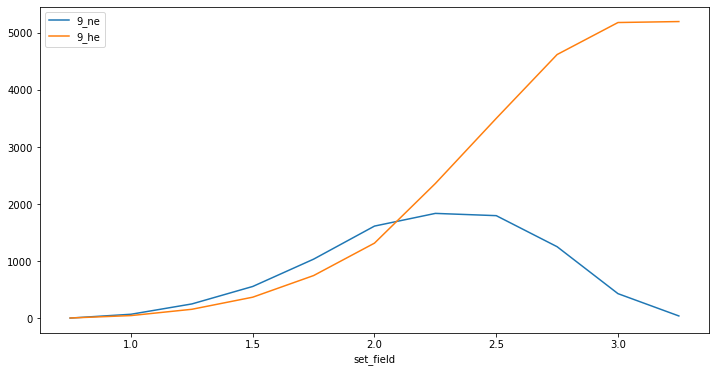

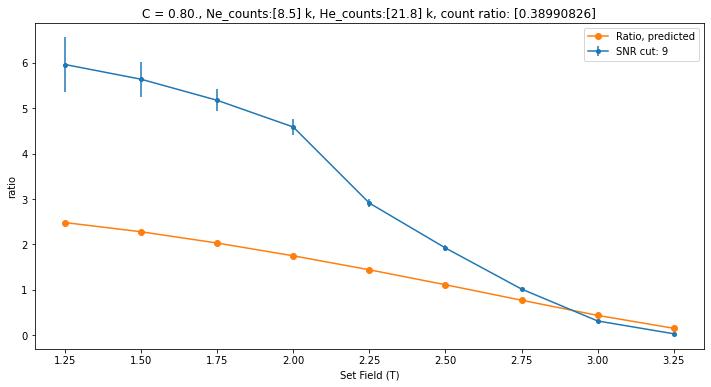

[100. 200.]


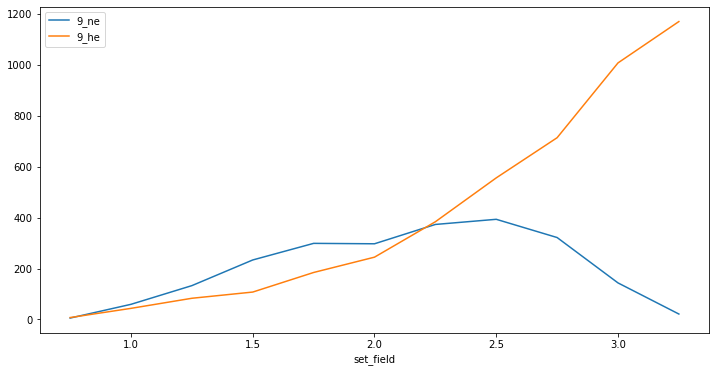

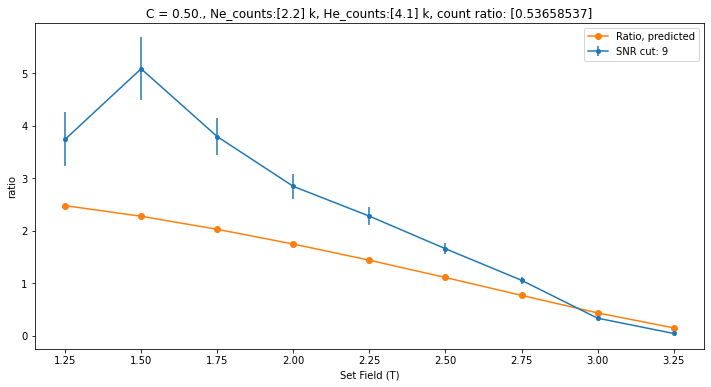

[200. 300.]


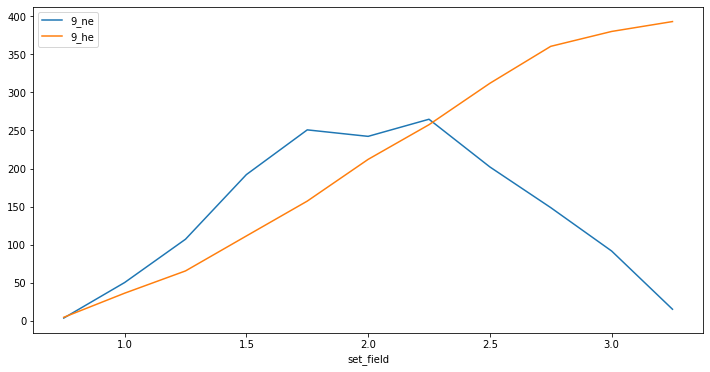

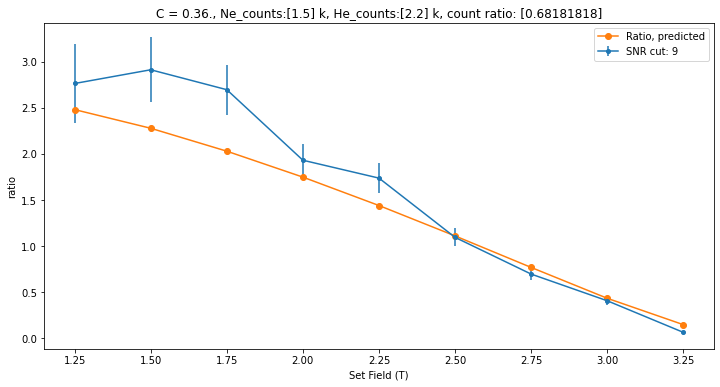

[300. 400.]


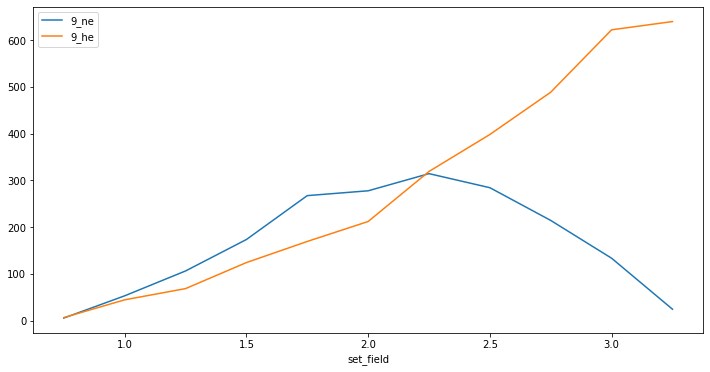

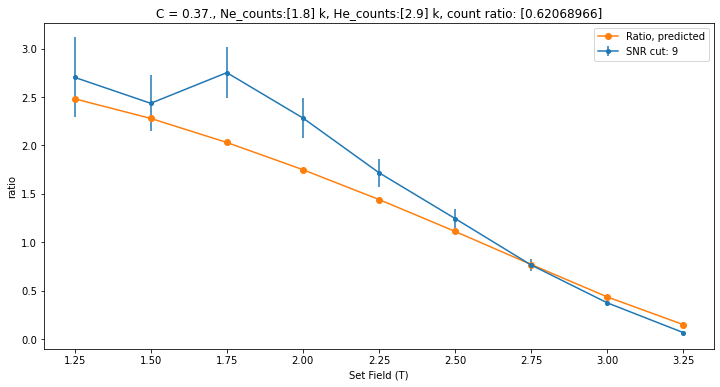

[400. 500.]


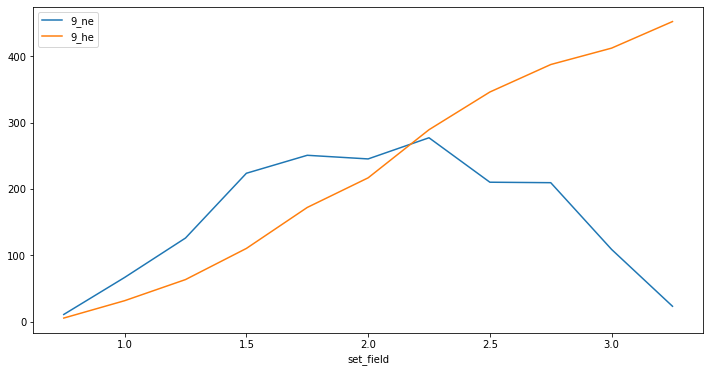

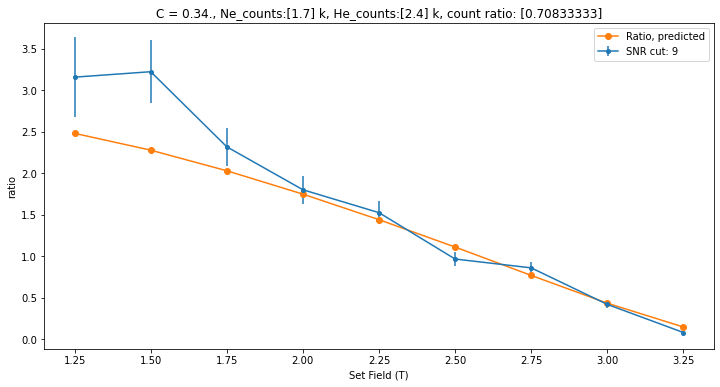

[500. 600.]


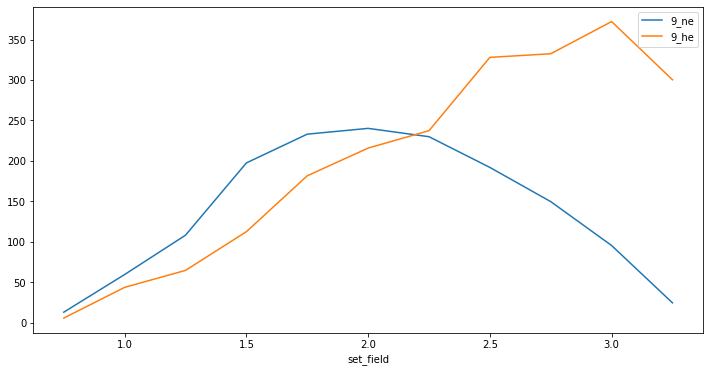

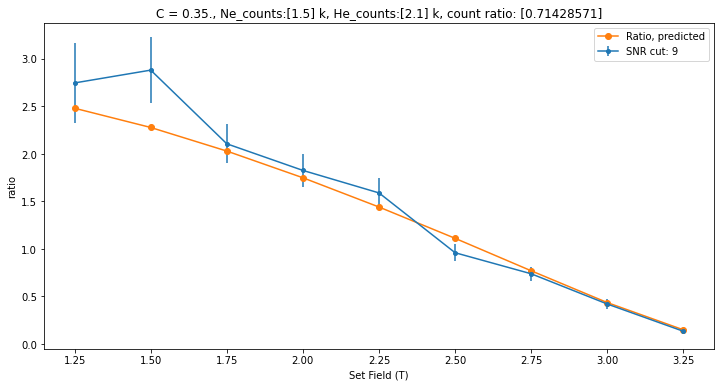

[600. 700.]


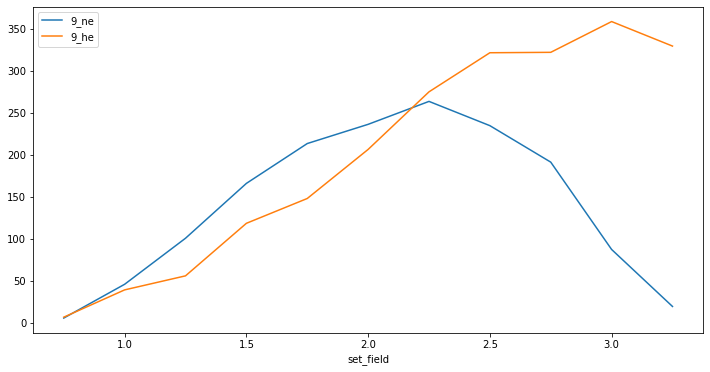

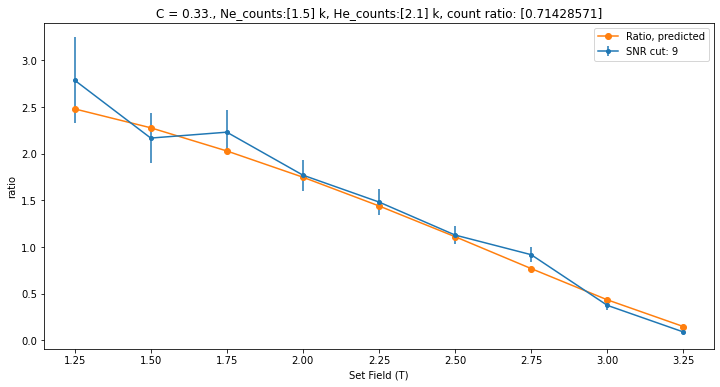

[700. 800.]


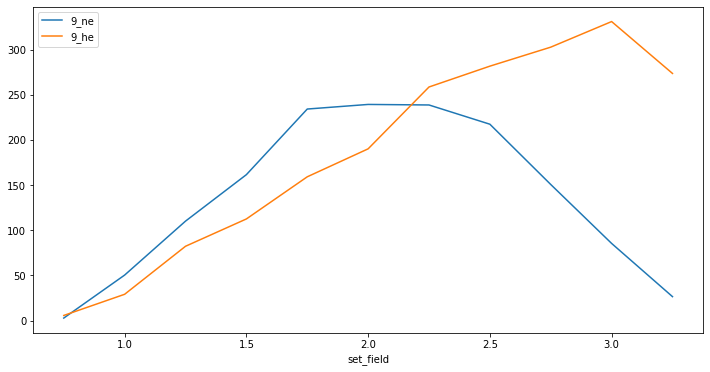

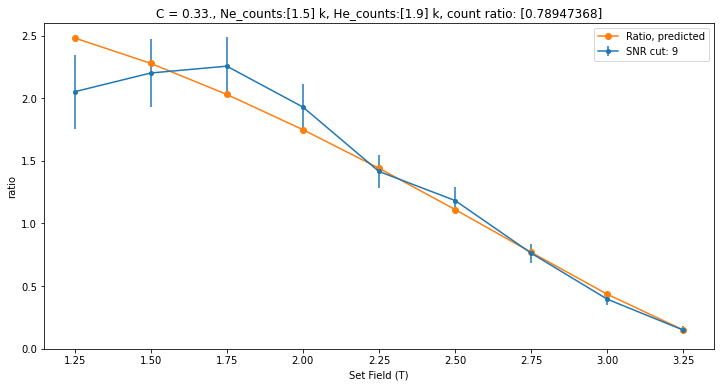

[800. 900.]


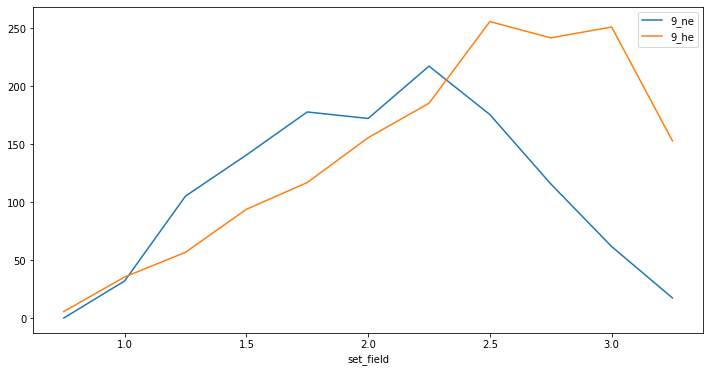

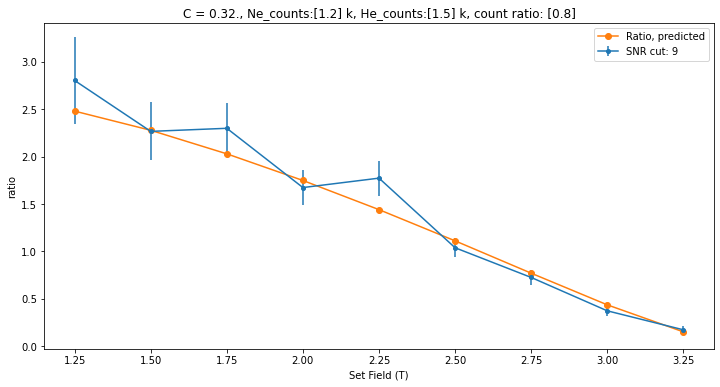

[ 900. 1000.]


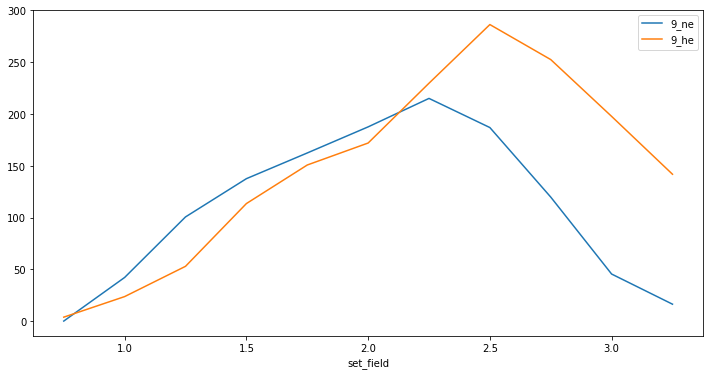

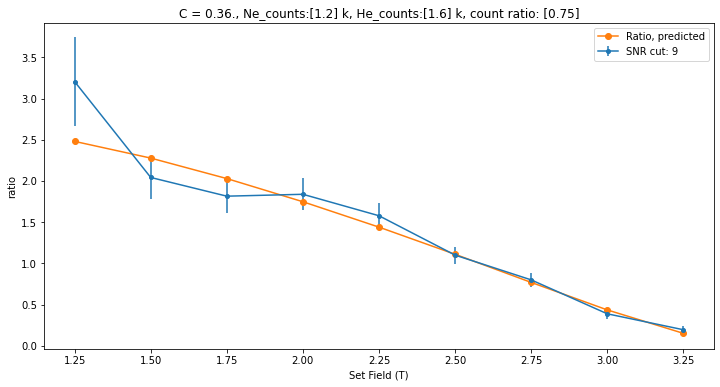

[1000. 1100.]


In [29]:
        
        ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = 0, plot = False)

        # Only take the fields you want: 
        ratio_pred = ratio_pred[ratio_pred.index.isin(set_fields)]
        ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]

        # Fit to the free normalization parameter. 
        def objfunc_chisq(C, ratio_pred, ratio_exp ): 

            # I think the lmfit does the least squares on these values for you but double check. 
            chisq_gauss = (ratio_pred["Ratio"] - C*ratio_exp["Ratio"])/ (C*ratio_exp["sRatio"])
            return chisq_gauss

        my_pars = Parameters()
        my_pars.add('C', value=1, min=0, max = 10, vary =True)

        result = minimize(objfunc_chisq, my_pars, args = (ratio_pred, ratio_exp))

        C = result.params["C"].value
        ratio_exp["Ratio"] = C*ratio_exp["Ratio"]
        ratio_exp["sRatio"] = C*ratio_exp["sRatio"]
        
        pm.plot_experimental_ratio(ratio_exp, ax0, label= f"SNR cut: {cut}")
        
        if cut == 9: 
            pm.plot_predicted_ratio(ratio_pred, ax0)
            
        ne_counts.append(snr_study_spectra["ne"][cut].event_count.sum().round(-2)/1000)
        he_counts.append(snr_study_spectra["he"][cut].event_count.sum().round(-2)/1000)
        count_ratio = np.array(ne_counts)/np.array(he_counts)
    
    # ax0.set_yscale("log")
    ax0.set_ylabel('ratio')
    ax0.set_xlabel('Set Field (T)')
    ax0.set_title(f"C = {C:.2f}., Ne_counts:{ne_counts} k, He_counts:{he_counts} k, count ratio: {count_ratio}")
    ax0.legend()
    plt.show()
    print(np.array(spectrum_cuts["EventStartFreq"])/1e6)

## **Fitting b, C simultaneously**

Steps:

* Working towards paper-01 submission.
* NOTE THIS IS NOW WRONG IN LIGHT OF THE WRONG BW FOR THE PREDICTION...

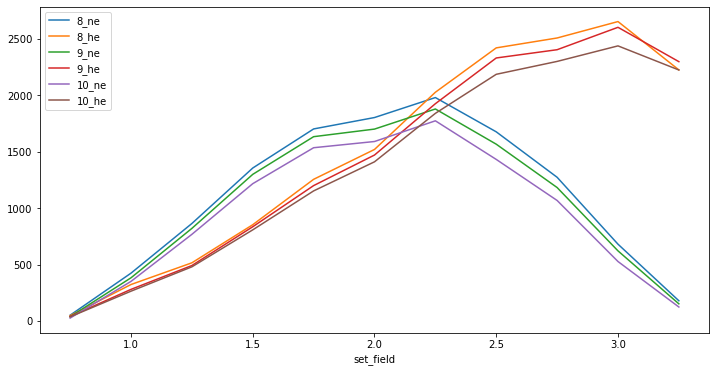

In [66]:
%matplotlib inline

set_fields = np.arange(1.25,3.5,.25)

spectrum_cuts = {
            "EventStartFreq": ((400)*1e6, (1200)*1e6)
            }

ne_cuts = {**both_cuts, **spectrum_cuts}
he_cuts = {**both_cuts, **spectrum_cuts}

ne_spectra = []
he_spectra = []       

for cut in snr_cuts:

    ne = snr_study["ne"][cut]
    ne_spectra.append(re.build_spectrum(ne.events.copy(), ne.root_files.copy(), ne_cuts))

    he = snr_study["he"][cut]
    he_spectra.append(re.build_spectrum(he.events.copy(), he.root_files.copy(), he_cuts))

snr_study_spectra = { "ne": dict(zip(snr_cuts,ne_spectra)),
                      "he": dict(zip(snr_cuts,he_spectra))}
fig, ax = plt.subplots(figsize=(12,6))
for cut in snr_cuts:
    for isotope in snr_study_spectra.keys():

        snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
plt.show()
# Make the experimental ratio with new normalization scheme. 

In [67]:
# Fit to the free normalization parameter. 
def objfunc_chisq(my_pars, freq_BWs, ratio_exp ): 
    # print(my_pars)
    C =my_pars['C'].value
    b =my_pars['b'].value

    ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = b, plot = False)
    # I think the lmfit does the least squares on these values for you but double check. 
    chisq_gauss = (ratio_pred["Ratio"] - C*ratio_exp["Ratio"])/ (C*ratio_exp["sRatio"])
    return chisq_gauss

In [68]:
ne_counts = []
he_counts = []
# for cut in snr_cuts: 
cut = 9
display(snr_study_spectra["ne"][cut])
ratio_exp = re.build_ratio_altnorm(snr_study_spectra["ne"][cut], snr_study_spectra["he"][cut])

# Make the predicted ratio.
freq_BW = np.array([17.9e9 + spectrum_cuts["EventStartFreq"][0] ,  19.1e9 -  spectrum_cuts["EventStartFreq"][1]])
freq_BWs = np.tile(freq_BW, (len(set_fields), 1))
ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = 0, plot = False)

# Only take the fields you want: 
ratio_pred = ratio_pred[ratio_pred.index.isin(set_fields)]
ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]

my_pars = Parameters()
my_pars.add('C', value=.32, min=0, max = 10, vary =True)
my_pars.add('b', value=0, min=-10, max = 10, vary =True)

print(my_pars)

result = minimize(objfunc_chisq, my_pars, args = (freq_BWs, ratio_exp))
print(fit_report(result.params))

C = result.params["C"].value
# print(C)
ratio_exp["Ratio"] = C*ratio_exp["Ratio"]
ratio_exp["sRatio"] = C*ratio_exp["sRatio"]

# display(ratio_exp)
base = "saved_ratio_dfs/"
path = f"exp_ratio_snr_{cut}.csv"
ratio_exp.to_csv(base + path)

# pm.plot_experimental_ratio(ratio_exp, ax0, label= f"SNR cut: {cut}")

if cut == 8: 
    path = f"pred_ratio.csv"
    ratio_pred.to_csv(base + path)
    # pm.plot_predicted_ratio(ratio_pred, ax0)

    

,set_field,event_count,tot_monitor_rate,seconds_of_data,normed_tot_monitor_rate,mon_adjusted_count,mon_adjusted_count_uncert
0,0.75,41.0,5727615.45,500,1.082157,37.887281,6.403124
1,1.00,418.0,5781146.46,498,1.092271,382.688795,20.445048
2,1.25,865.0,5578845.11,499,1.054049,820.644835,29.410882
3,1.50,1191.0,4850415.98,495,0.916422,1299.619481,34.510868
4,1.75,1570.0,5086716.98,497,0.961068,1633.599211,39.623226
5,2.00,1678.0,5221731.49,495,0.986577,1700.829805,40.963398
6,2.25,1512.0,4258761.38,395,0.804637,1879.108778,38.884444
7,2.50,1543.0,5211754.37,497,0.984692,1566.987110,39.281039
8,2.75,1225.0,5482016.39,497,1.035755,1182.712525,35.000000
9,3.00,684.0,5826929.03,500,1.100921,621.297792,26.153394


Parameters([('C', <Parameter 'C', value=0.32, bounds=[0:10]>), ('b', <Parameter 'b', value=0, bounds=[-10:10]>)])
[[Variables]]
    C:  0.31589180 +/- 0.00403394 (1.28%) (init = 0.32)
    b: -0.03246726 +/- 0.08764493 (269.95%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(C, b) = 0.231


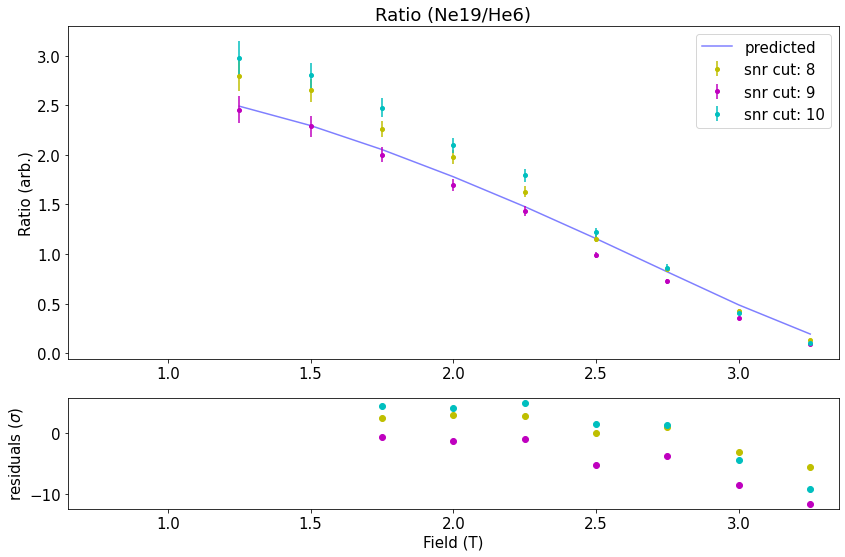

In [69]:
def build_ratio_plot(ax0, ax1, dir_path = "saved_ratio_dfs", yscale = "linear"): 
    
    # Plot the predicted ratio. 
    pred_ratio = pd.read_csv(dir_path + "/pred_ratio.csv", index_col = 0)
    ax0.plot(pred_ratio.index, pred_ratio.Ratio, label= "predicted", color = "b", alpha = .5 )
    
    
    exp_ratios = [pd.read_csv(dir_path + f"/exp_ratio_snr_{cut}.csv", index_col = 0) for cut in range(8,11,1) ]
    colors = ["y", "m", "c"] 
    for i, (exp_ratio, cut) in enumerate(zip(exp_ratios,range(8,11,1))): 

        # Plot the experimental ratio. 
        ax0.errorbar(
        exp_ratio.index,
        exp_ratio.Ratio,
        yerr=exp_ratio.sRatio,
        label=f"snr cut: {cut}",
        marker="o",
        ls = "None",
        ms=4, 
        alpha = 1, 
        color = colors[i])
        
        # Plot the residuals starting at 1.25 T (index = 2)
        start = 2
        ax1.plot(pred_ratio.index[start:], (exp_ratio.Ratio.iloc[start:] - pred_ratio.Ratio.iloc[start:])/exp_ratio.sRatio.iloc[start:] , 
                 label= f"snr cut: {cut}", 
                 marker="o", 
                 ls = "None",
                 ms=6, 
                 color = colors[i])
    
    
    ax0.set_yscale(yscale)
    ax0.set_ylabel('Ratio (arb.)')
    ax0.set_title(f"Ratio (Ne19/He6)")
    ax0.legend()
    
    ax1.set_xlabel('Field (T)')
    ax1.set_ylabel(r'residuals ($\sigma$)')
    
    ax0.set_xlim(.65,3.35)
    ax1.set_xlim(.65,3.35)
    
    
    return None


plt.rcParams.update({'font.size': 15})
f, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(12,8))
build_ratio_plot(ax0,ax1, yscale = "linear")

plt.tight_layout()
plt.show()

# ________________________________________
# Old/Work on the way. 

## Correcting for track length differences: 

* Ok this isn't going to be that easy. But it was worth a shot. 

In [107]:
# 90th Percentile
def q01(x):
    return x.quantile(0.01)

In [108]:
both_cuts = {
            "EventStartFreq": (0e6, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf),
            "mTotalSNR": (40, np.inf),
            "mTotalNUP": (0, np.inf)
            }

additional_cuts = {
                "EventStartFreq": (200e6, 1200e6),
                "EventNBins": (0, np.inf),
                }
ne_cuts = {**both_cuts, **additional_cuts}
he_cuts = {**both_cuts, **additional_cuts}

set_field
0.75    1.873821
1.00    1.349786
1.25    0.840107
1.50    0.961538
1.75    0.960158
2.00    0.765076
2.25    0.806033
2.50    0.886263
2.75    0.836240
3.00    0.733515
3.25    0.987463
Name: q01, dtype: float64

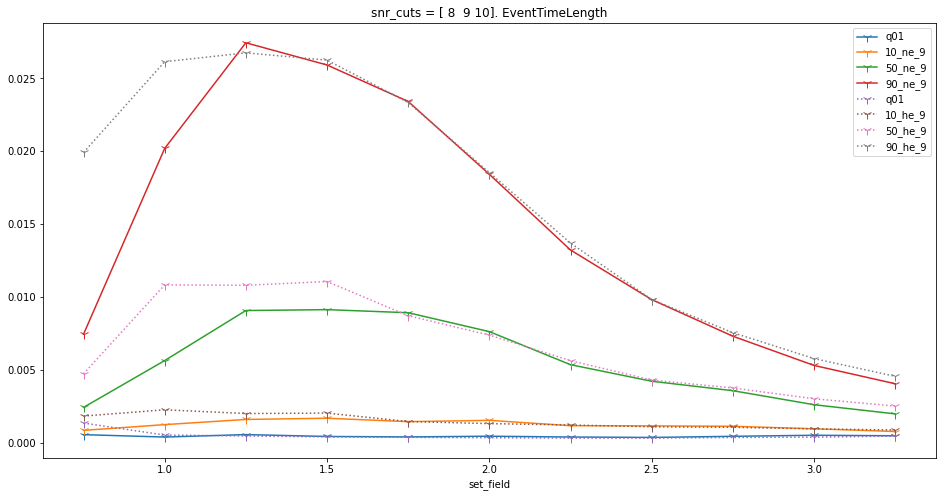

In [109]:
%matplotlib inline

aggs = [q01, q10, q50, q90]
col_names = ["05", "10", "50", "90"]

snr_cuts = np.arange(8,11,1)
column = "EventTimeLength" 
    
fig0, ax0 = plt.subplots(figsize=(16,8))
for i, cut in enumerate([9]):

    events_ne = snr_study["ne"][cut].events
    events_he = snr_study["he"][cut].events
    # print(events_ne.EventStartFreq.min())
    events_cut_ne = re.cut_df(events_ne, ne_cuts)
    events_cut_he = re.cut_df(events_he, he_cuts)
    # print(events_cut_ne.EventStartFreq.min())
    ne_col_names = [col_name + f"_ne_{cut}" for col_name in col_names]
    he_col_names = [col_name + f"_he_{cut}" for col_name in col_names]
    orig_col_names = ["q" + col_name for col_name in col_names]

    events_cut_ne.groupby("set_field")[column].agg(aggs).rename(columns = dict(zip(orig_col_names, ne_col_names))).plot(ax = ax0, marker =f"{i+1}", ms = 10 )
    events_cut_he.groupby("set_field")[column].agg(aggs).rename(columns = dict(zip(orig_col_names, he_col_names))).plot(ax = ax0, ls = "dotted",marker =f"{i+1}", ms = 10)
    
    tau_ne = events_cut_ne.groupby("set_field")[column].agg(aggs)["q90"]
    tau_he = events_cut_he.groupby("set_field")[column].agg(aggs)["q90"]
    
    tmin_ne = events_cut_ne.groupby("set_field")[column].agg(aggs)["q01"]
    tmin_he = events_cut_he.groupby("set_field")[column].agg(aggs)["q01"]
    # print(tau_ne, tau_he)
    
    correction = np.exp(-tmin_ne/tmin_he)
    # correction = np.exp(tau_he/tau_ne)
    # display(correction)
    # events_cut_he.groupby("set_field")[column].agg(aggs).rename(columns = dict(zip(orig_col_names, he_col_names))).plot(ax = ax0, ls = "dotted",marker =f"{i+1}", ms = 10)

    correction = correction/correction.mean()
    correction
    display(correction)
    plt.title(f"snr_cuts = {snr_cuts}. {column}")
    correction
plt.legend()
plt.show()
    

## **Step 3: Working on clustering.**

* Is part of our issue a sensitivity to the eps parameter? 
* Trying to be careful about this and not p-hack.

### More dbscan clustering?? 

Notes: 
* Could an excess of events at the 1.5 T and 1.75 T levels be effecting us? Also curious how sensitve we are to this eps. If very sensitive then that's a problem. 
* Also think about having an increasing epsilon with decreasing field.
* yes this is big. Weird stuff is going on for he and ne at low fields. 
* In the limit of very small eps, this is making sense. (nothing is getting combined)

In [18]:
def cluster_events(
         events, eps={}, min_samples=1, features=["EventTimeIntc"]
    ):
        """Notes: 
            * This is really clustering events not track segments. 
            * Default up to 1/24/23 was .003 up to now. 
            * On 1/24/23 1600, Drew is testing how .005 performs. 
        """

        events_copy = events.copy()
        events_copy["event_label"] = np.NaN

        for i, (name, group) in enumerate(
            events_copy.groupby(["run_id", "file_id"])
        ):

            # print(f"\nClustering: run_id: {name[0]},  file_id: {name[1]}")
            set_field = group.set_field.mean()
            # print(set_field)
            condition = (events_copy.run_id == name[0]) & (
                events_copy.file_id == name[1]
            )
            # print(f"Events in file: {condition.sum()}")
            # print(f"Fraction of total tracks in dataset: {condition.mean()}")

            events_copy.loc[condition, "event_label"] = dbscan_clustering(
                events_copy[condition],
                features=list(features),
                eps=eps[set_field],
                min_samples=min_samples,
            )
        events_copy["EventID"] = events_copy["event_label"] + 1
        
        # # Should do this more carefully and not just lose all that info... DO LATER
        # events_copy = events_copy.groupby(["run_id", "file_id", "EventID"]).first().reset_index()

        return events_copy

    
    
def cluster_events(
         events, clust_params={}, min_samples=1
    ):
        """Notes: 
            * This is really clustering events not track segments. 
            * Default up to 1/24/23 was .003 up to now. 
            * On 1/24/23 1600, Drew is testing how .005 performs. 
        """

        events_copy = events.copy()
        events_copy["event_label"] = np.NaN

        for i, (name, group) in enumerate(
            events_copy.groupby(["run_id", "file_id"])
        ):

            set_field = group.set_field.mean()

            condition = (events_copy.run_id == name[0]) & (
                events_copy.file_id == name[1]
            )

            events_copy.loc[condition, "event_label"] = dbscan_clustering(
                events_copy[condition],
                features=clust_params[set_field]["features"],
                eps=clust_params[set_field]["eps"],
                min_samples=min_samples,
            )
        events_copy["EventID"] = events_copy["event_label"] + 1
        
        return events_copy    
    
def dbscan_clustering( df, features: list, eps: float, min_samples: int):

    # Normalize features.
    # THIS IS WRONG NEED TO FIX!!
    # print(df[features])
    # X_norm = StandardScaler().fit_transform(df[features])
    # print(X_norm)
    # Compute DBSCAN
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(df[features])
    labels = db.labels_

    return labels

def update_event_info(events_in: pd.DataFrame) -> pd.DataFrame:

        events = events_in.copy()

        events["EventStartTime"] = events.groupby(["run_id", "file_id", "EventID"])[
            "EventStartTime"
        ].transform("min")
        events["EventEndTime"] = events.groupby(["run_id", "file_id", "EventID"])[
            "EventEndTime"
        ].transform("max")

        events["EventStartFreq"] = events.groupby(["run_id", "file_id", "EventID"])[
            "EventStartFreq"
        ].transform("min")
        events["EventEndFreq"] = events.groupby(["run_id", "file_id", "EventID"])[
            "EventEndFreq"
        ].transform("max")

        events["EventTimeLength"] = events["EventEndTime"] - events["EventStartTime"]
        events["EventFreqLength"] = events["EventEndFreq"] - events["EventStartFreq"]
        events["EventNBins"] = events.groupby(["run_id", "file_id", "EventID"])[
            "EventNBins"
        ].transform("sum")

        events["EventSlope"] = events["EventFreqLength"] / events["EventTimeLength"]
        
        cols_to_average_over = ["EventTrackCoverage",
                                "EventTrackTot",
                                "EventFreqIntc",
                                "EventTimeIntc",
                                "mMeanSNR",
                                "sMeanSNR",
                                "mTotalSNR",
                                "sTotalSNR",
                                "mMaxSNR",
                                "sMaxSNR",
                                "mTotalNUP",
                                "sTotalNUP",
                                "mTotalPower",
                                "sTotalPower",
                                "field",
                                "set_field",
                                "monitor_rate",
                            ]
        for col in cols_to_average_over: 
            
            events[col] = events.groupby(["run_id", "file_id", "EventID"])[
                col
            ].transform("mean")

        return events

def build_events(events: pd.DataFrame) -> pd.DataFrame:

    event_cols = [
        "run_id",
        "file_id",
        "EventID",
        "EventStartTime",
        "EventEndTime",
        "EventStartFreq",
        "EventEndFreq",
        "EventTimeLength",
        "EventFreqLength",
        "EventTrackCoverage",
        "EventSlope",
        "EventNBins",
        "EventTrackTot",
        "EventFreqIntc",
        "EventTimeIntc",
        "mMeanSNR",
        "sMeanSNR",
        "mTotalSNR",
        "sTotalSNR",
        "mMaxSNR",
        "sMaxSNR",
        "mTotalNUP",
        "sTotalNUP",
        "mTotalPower",
        "sTotalPower",
        "field",
        "set_field",
        "monitor_rate",
    ]
    events = (
        events.groupby(["run_id", "file_id", "EventID"])
        .first()
        .reset_index()[event_cols]
    )

    return events

In [19]:
# events = cluster_events(snr_study["he"][8].events[0:1000],eps=0.1)

set_fields = np.arange(.75,3.5,.25)
epss = np.array([100,.5,.5,.5,.5,.05,.05, .005,.005, .005, .005])
# epss = np.array([.00001]*11)

# print(set_fields, epss)
eps_dict = dict(zip(set_fields, epss))
# print(eps_dict)

events = cluster_events(snr_study["he"][9].events[0:10000],eps=eps_dict)

# Should do this more carefully and not just lose all that info... DO LATER
events = events.groupby(["run_id", "file_id", "EventID", "set_field"]).EventStartTime.count().to_frame("frac_combined").reset_index()

display(events.groupby("set_field").mean())

events = cluster_events(snr_study["ne"][9].events[0:10000],eps=eps_dict)

# Should do this more carefully and not just lose all that info... DO LATER
events = events.groupby(["run_id", "file_id", "EventID", "set_field"]).EventStartTime.count().to_frame("frac_combined").reset_index()

display(events.groupby("set_field").mean())

TypeError: cluster_events() got an unexpected keyword argument 'eps'

In [ ]:


test_eps = np.linspace(.001,.01,20)
eps_test_dict = dict(zip(set_fields, [[]]*len(set_fields)))
print(eps_test_dict)
eps_test = pd.DataFrame(eps_test_dict)
print(eps_test)
                     
for eps in test_eps:
    
    epss = np.array([eps]*11)

    # print(set_fields, epss)
    eps_dict = dict(zip(set_fields, epss))

    events = cluster_events(snr_study["he"][9].events[0:10000],eps=eps_dict)

    # Should do this more carefully and not just lose all that info... DO LATER
    events = events.groupby(["run_id", "file_id", "EventID", "set_field"]).EventStartTime.count().to_frame("frac_combined").reset_index()

    results = events.groupby("set_field").mean()
    # display(results)
    eps_test = eps_test.append(results.frac_combined)
    
    # display(eps_test)

    # ax.plot(events["set_field"], events["frac_combined"], "o", label = f"{eps}", linestyle='None', ms = 10 )

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
eps_test.set_index(test_eps, inplace = True)
display(eps_test)
eps_test.plot(ax = ax)
ax.set_yscale("log")
plt.show()

### Now testing the results of the dbscan clustering to make sure they are sensible: 

#### Start by clustering

* See what happens when you cluster on proximity: features=["EventStartTime", "EventStartFreq"]

* List of correct eps for each field: 
    * 0.75: .05, [ "EventTimeIntc", "EventStartTime"]
    * 1.0:  .05, [ "EventTimeIntc", "EventStartTime"]
    * 1.25: .02, [ "EventTimeIntc", "EventStartTime"]
    * 1.5:  .01 , [ "EventTimeIntc"]
    * 1.75: .01, [ "EventTimeIntc"]
    * 2.0:  .01, [ "EventTimeIntc"]
    * 2.25:  .005, [ "EventTimeIntc"]
    * 2.5:  .001, [ "EventTimeIntc"]
    * 2.75:  .001, [ "EventTimeIntc"]
    * 3.0:  .001, [ "EventTimeIntc"]
    * 3.25:  .001, [ "EventTimeIntc"]

In [ ]:
cut = 9


features = [ "EventTimeIntc", "EventStartTime"]
set_fields = np.arange(.75,3.5,.25)
epss = np.array([.05,.05,.02,.01,.01,.01, .005, .001, .001, .001, .001])
clust_params = {}

for (set_field, eps) in zip(set_fields, epss): 
    
    clust_params.update({set_field : {"eps":eps}})
    
    if set_field < 1.5: 
        clust_params[set_field].update(  {"features":features} )
    else: 
        clust_params[set_field].update( {"features":["EventTimeIntc"]} )
        

print(clust_params)

In [ ]:
#cluster
events_ne = cluster_events(snr_study["ne"][cut].events,clust_params=clust_params)
events_he = cluster_events(snr_study["he"][cut].events,clust_params=clust_params)
# cleanup
events_ne = update_event_info(events_ne)
events_ne = build_events(events_ne)
events_he = update_event_info(events_he)
events_he = build_events(events_he)

# Sanity check the clustering. 
display(snr_study["ne"][cut].events.groupby("set_field").mean()-events_ne.groupby("set_field").mean())
display(events_ne.groupby("set_field").mean())
# Print the change in counts: 
pre_ne = snr_study["ne"][cut].events.groupby("set_field").file_id.count()
post_ne = events_ne.groupby("set_field").file_id.count()
pre_he = snr_study["he"][cut].events.groupby("set_field").file_id.count()
post_he = events_he.groupby("set_field").file_id.count()

print("ne", post_ne/pre_ne)
print("he",post_he/pre_he)
print("rel_change", (post_ne/pre_ne)/(post_he/pre_he))

In [ ]:
both_cuts = {
            "EventStartFreq": (0, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.01, np.inf)
            }

just_he_cuts = {
                "mTotalSNR": (39, np.inf),
                "mTotalNUP": (0, np.inf)
                }
ne_cuts = both_cuts
he_cuts = {**just_he_cuts, **both_cuts}

#### Visualizing dbscan. 

* rid = 551, fid = 2. Good example of it not working well at all. Failing in an odd way... 

In [ ]:
fid_max = 3
set_fields = [3.0]
# events_ne = snr_study["ne"][cut].events
# events_he = snr_study["he"][cut].events

events_cut_ne = re.cut_df(events_ne, ne_cuts)
events_cut_he = re.cut_df(events_he, he_cuts)
display(events_cut_ne)


# print("\n\n\nHELIUM dbscan")
# qc.viz_events(events_cut_he, file_id_max=fid_max, set_fields = set_fields, title = "He6_dbscan")


events_ne_noclust = snr_study["ne"][cut].events
events_he_noclust = snr_study["he"][cut].events

events_cut_ne = re.cut_df(events_ne_noclust, ne_cuts)
events_cut_he = re.cut_df(events_he_noclust, he_cuts)

print("\n\n\nNEON")
qc.viz_events(events_cut_ne, file_id_max=fid_max, set_fields = set_fields, title = "Ne19")


print("\n\n\nNEON dbscan")
qc.viz_events(events_cut_ne, file_id_max=fid_max, set_fields = set_fields, title = "Ne19_dbscan")



# print("\n\n\nHELIUM")
# qc.viz_events(events_cut_he, file_id_max=fid_max, set_fields = set_fields, title = "He6")

### Testing dbscan clusterings effect on the ratio: 

Notes: 

* Investigate if the cuts before the clustering or after are having an impact on the ratio. 

In [ ]:
both_cuts = {
            "EventStartFreq": (0, 1200e6),
            "EventNBins": (0, np.inf), 
            "EventTimeLength": (0,.05),
            "EventTimeIntc": (-.5e7,np.inf),
            "EventFreqIntc": (-2e11,np.inf),
            "EventSlope": (.01e10, np.inf),
            "EventTrackCoverage": (.4, np.inf),
        
            }

just_he_cuts = {
                "mTotalSNR": (39, np.inf),
                "mTotalNUP": (0, np.inf)
                }

ne_cuts = both_cuts
he_cuts = {**just_he_cuts, **both_cuts}

spectrum_cuts = {
                "EventStartFreq": ((250)*1e6, (1200)*1e6), 
                "EventStartTime":(0.001,np.inf), 
                "EventNBins": (100, np.inf)
                }

ne_cuts = {**just_he_cuts, **both_cuts, **spectrum_cuts}
he_cuts = {**just_he_cuts, **both_cuts, **spectrum_cuts}

print(ne_cuts)
ne_spectra = []
he_spectra = []       
print(clust_params)

for cut in snr_cuts:
    
    # Start by applying clustering: 
    #cluster
    print(len(snr_study["ne"][cut].events))
    events_ne = cluster_events(snr_study["ne"][cut].events,clust_params=clust_params)
    events_he = cluster_events(snr_study["he"][cut].events,clust_params=clust_params)
    # cleanup
    events_ne = update_event_info(events_ne)
    events_ne = build_events(events_ne)
    events_he = update_event_info(events_he)
    events_he = build_events(events_he)
    print(len(events_ne))
    # ne = snr_study["ne"][cut]
    ne_spectra.append(re.build_spectrum(events_ne, ne.root_files, ne_cuts))
    
    # he = snr_study["he"][cut]
    he_spectra.append(re.build_spectrum(events_he, he.root_files, he_cuts))
    
snr_study_spectra = { "ne": dict(zip(snr_cuts,ne_spectra)),
                      "he": dict(zip(snr_cuts,he_spectra))}

### Sanity check the normed rates. 

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
for cut in snr_cuts: 
    for isotope in snr_study_spectra.keys():
        snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
plt.show()

### Look at the ratio. 

In [1]:
%matplotlib inline

set_fields = np.arange(.75,3.5,.25)


freq = 150
fig, ax = plt.subplots(figsize=(12,6))
for cut in snr_cuts:
    for isotope in snr_study_spectra.keys():

        snr_study_spectra[isotope][cut].plot(x = "set_field", y = "mon_adjusted_count", ax = ax, label = f"{cut}_{isotope}")
plt.show()
    # Make the experimental ratio with new normalization scheme. 

fig0, ax0 = plt.subplots(figsize=(12,6))

ne_counts = []
he_counts = []
for cut in snr_cuts: 

    ratio_exp = re.build_ratio_altnorm(snr_study_spectra["ne"][cut], snr_study_spectra["he"][cut])
    print(snr_study_spectra["ne"][cut])
    # Make the predicted ratio.
    freq_BW = np.array([17.9e9 + spectrum_cuts["EventStartFreq"][0] ,  19.1e9 -  spectrum_cuts["EventStartFreq"][1]])
    freq_BWs = np.tile(freq_BW, (len(set_fields), 1))
    ratio_pred = rp.AUC_expectation(set_fields, freq_BWs, b = 0, plot = False)

    # Only take the fields you want: 
    ratio_pred = ratio_pred[ratio_pred.index.isin(set_fields)]
    ratio_exp = ratio_exp[ratio_exp.index.isin(set_fields)]

    # Fit to the free normalization parameter. 
    def objfunc_chisq(C, ratio_pred, ratio_exp ): 

        # I think the lmfit does the least squares on these values for you but double check. 
        chisq_gauss = (ratio_pred["Ratio"] - C*ratio_exp["Ratio"])/ (C*ratio_exp["sRatio"])
        return chisq_gauss

    my_pars = Parameters()
    my_pars.add('C', value=1, min=0, max = 10, vary =True)

    result = minimize(objfunc_chisq, my_pars, args = (ratio_pred, ratio_exp))

    C = result.params["C"].value
    ratio_exp["Ratio"] = C*ratio_exp["Ratio"]
    ratio_exp["sRatio"] = C*ratio_exp["sRatio"]

    pm.plot_predicted_ratio(ratio_pred, ax0 )
    pm.plot_experimental_ratio(ratio_exp, ax0 )

    ne_counts.append(snr_study_spectra["ne"][cut].event_count.sum().round(-2)/1000)
    he_counts.append(snr_study_spectra["he"][cut].event_count.sum().round(-2)/1000)
    count_ratio = np.array(ne_counts)/np.array(he_counts)

ax0.set_ylabel('ratio')
ax0.set_xlabel('Set Field (T)')
ax0.set_title(f"C = {C:.2f}., Ne_counts:{ne_counts} k, He_counts:{he_counts} k, count ratio: {count_ratio}")
ax0.legend()
plt.show()
print(np.array(spectrum_cuts["EventStartFreq"])/1e6)

NameError: name 'np' is not defined

### 0: Make a measure of distance between events and histogram that vs field. 

* Below is useful, need to make sure to have it work before and after cuts are applied and to print the set field and such in title. 

In [ ]:
# attempting some clustring. 
from sklearn.cluster import AgglomerativeClustering
import numpy as np
X = np.array([[1, 2], [1, 4], [1, 0],
              [4, 2], [4, 4], [4, 0]])
clustering = AgglomerativeClustering().fit(X)
clustering

clustering.labels_
plt.plot(X)

snr_study["he"][8].events.groupby(["run_id","file_id"])

### 1: Make a simple fake dataset. 

* Must contain all the relavant fields. 
* How to find average distance between a group of points. That could be useful to see if scattering is truly an issue. 

In [ ]:
snr_study["he"][8].events.groupby(["run_id","file_id"]).EventStartTime.mean().plot()



In [ ]:
cols = snr_study["ne"][8].events.columns.to_list()[:7]
print(cols)

### Back to making a fake dataset to validate that dbscan is working as desired. 

In [ ]:
fid_max = 3
set_fields = [1.25]

events_ne_noclust = snr_study["ne"][cut].events
events_cut_ne = re.cut_df(events_ne_noclust, ne_cuts)

# Simplify df: 
files = [(553,1),(551,2),(544,2)]

condition = (
# ((events_cut_ne.run_id == files[0][0]) &
#              (events_cut_ne.file_id == files[0][1]))| 
#              (events_cut_ne.run_id == files[1][0]) &
#              (events_cut_ne.file_id == files[1][1])| 
             (events_cut_ne.run_id == files[2][0]) &
             (events_cut_ne.file_id == files[2][1]))

events_test = events_cut_ne[condition].copy()

print(condition.sum())
print("\n\n\nNEON")
qc.viz_events(events_test, file_id_max=fid_max, set_fields = set_fields, title = "Ne19 test")


#### Cluster the test set

In [ ]:
set_fields = np.arange(.75,3.5,.25)
eps = .02
# epss = np.array([.005,.005,.005,.005,.005,.005,.005, .005,.005, .005, .005])
epss = np.array([eps]*len(set_fields))
eps_dict = dict(zip(set_fields, epss))
print(eps_dict)

#cluster
events_test["nEventStartFreq"] = (events_test["EventStartFreq"] - .1e9) / 1.1e9
display(events_test)
# print(events_test["nEventStartFreq"])
events_test_c = cluster_events(events_test,eps=eps_dict, features = [ "EventTimeIntc", "EventStartTime"])

# ["EventTimeIntc", "EventStartTime", "nEventStartFreq"]
display(events_test_c)
# cleanup
events_test_c = update_event_info(events_test_c)
display(events_test_c)
events_test_c = build_events(events_test_c)
display(events_test_c)
set_fields = [1.25]

print("\n\n\nNEON")
qc.viz_events(events_test_c, file_id_max=fid_max, set_fields = set_fields, title = "Ne19 test. clustered")


In [ ]:
l1 = [123]*4
l2 = [127]*4
run_id = np.array(l1 + l2)
print(run_id)
file_id = np.array([0,0,0,1,0,0,0,0])
EventID = np.array([0,1,2,0,0,1,2,3])
EventStartTime = np.array([.1,.11,.6,])
EventStartFreq = 

arrays = [run_id, file_id]
events = dict(zip(cols,[run_id]*7))
print(events)


tracks["EventTimeIntc"] = (
            tracks["EventStartTime"] - tracks["EventStartFreq"] / tracks["EventSlope"]
        )
              
events = pd.DataFrame(events)
display(events)